# Declaration of Originality

![image.png](attachment:image.png)

**TEMASEK POLYTECHNIC**
<br>**SCHOOL OF INFORMATICS & IT**
<br>**DIPLOMA IN INFORMATION TECHNOLOGY**
<br>**MACHINE LEARNING FOR DEVELOPERS (CAI2C08)**
<br>**AY2025/2026 OCTOBER SEMESTER**

**PROJECT PROGRAM CODES**
* Student Name (Matric Number)  :
* Tutorial Group                :  
* Tutor						    :  
* Submission Date               : 


**Declaration of Originality**
* I am the originator of this work and I have appropriately acknowledged all other original sources used as my references for this work.
* I understand that Plagiarism is the act of taking and using the whole or any part of another person’s work, including work generated by AI, and presenting it as my own.
* I understand that Plagiarism is an academic offence and if I am found to have committed or abetted the offence of plagiarism in relation to this submitted work, disciplinary action will be enforced.

## Libraries

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import mean_absolute_error, mean_squared_error, root_mean_squared_error, r2_score

ModuleNotFoundError: No module named 'pandas'

## Business Understanding

US house prices can have a wide range and it's hard to get a good understanding on their prices based on some features that you want. 

## Data Understanding

### Load dataset

In [ ]:
df = pd.read_csv('train.csv')
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [ ]:
df = df.drop('Id', axis=1)
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


### Summary statistics

In [ ]:
df[df.duplicated()] # Search for duplicate columns

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [ ]:
# Features that contain null values and their amount

for i in df.columns:        
    x = df[i].isna().sum()
    if x > 0:
        print(f'{i}: {x}')


LotFrontage: 259
Alley: 1369
MasVnrType: 872
MasVnrArea: 8
BsmtQual: 37
BsmtCond: 37
BsmtExposure: 38
BsmtFinType1: 37
BsmtFinType2: 38
Electrical: 1
FireplaceQu: 690
GarageType: 81
GarageYrBlt: 81
GarageFinish: 81
GarageQual: 81
GarageCond: 81
PoolQC: 1453
Fence: 1179
MiscFeature: 1406


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [ ]:
df.describe(include='all')

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1460.000000,1460,1201.000000,1460.000000,1460,91,1460,1460,1460,1460,...,1460.000000,7,281,54,1460.000000,1460.000000,1460.000000,1460,1460,1460.000000
unique,NaN,5,NaN,NaN,2,2,4,4,2,5,...,NaN,3,4,4,NaN,NaN,NaN,9,6,NaN
top,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,...,NaN,Gd,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,1151,NaN,NaN,1454,50,925,1311,1459,1052,...,NaN,3,157,49,NaN,NaN,NaN,1267,1198,NaN
mean,56.897260,NaN,70.049958,10516.828082,NaN,NaN,NaN,NaN,NaN,NaN,...,2.758904,NaN,NaN,NaN,43.489041,6.321918,2007.815753,NaN,NaN,180921.195890
std,42.300571,NaN,24.284752,9981.264932,NaN,NaN,NaN,NaN,NaN,NaN,...,40.177307,NaN,NaN,NaN,496.123024,2.703626,1.328095,NaN,NaN,79442.502883
min,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000,NaN,NaN,NaN,0.000000,1.000000,2006.000000,NaN,NaN,34900.000000
25%,20.000000,NaN,59.000000,7553.500000,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000,NaN,NaN,NaN,0.000000,5.000000,2007.000000,NaN,NaN,129975.000000
50%,50.000000,NaN,69.000000,9478.500000,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000,NaN,NaN,NaN,0.000000,6.000000,2008.000000,NaN,NaN,163000.000000
75%,70.000000,NaN,80.000000,11601.500000,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000,NaN,NaN,NaN,0.000000,8.000000,2009.000000,NaN,NaN,214000.000000


## Data cleaning & Data visualisation

In [ ]:
df['Electrical'].unique()

array(['SBrkr', 'FuseF', 'FuseA', 'FuseP', 'Mix', nan], dtype=object)

In [ ]:
df['Electrical'] = df['Electrical'].fillna('SBrkr')
df['Electrical'].unique()

array(['SBrkr', 'FuseF', 'FuseA', 'FuseP', 'Mix'], dtype=object)

In [ ]:
df.loc[(df['PoolArea'] == 0) & (df['PoolQC'].isna())]
#df.loc[(df['PoolQC'].isna() == True)]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [ ]:
df['PoolQC'] = df['PoolQC'].fillna('NA')
df['PoolQC'].isna().sum()

np.int64(0)

In [ ]:
df['BsmtQual'].unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

In [ ]:
df['BsmtCond'].unique()

array(['TA', 'Gd', nan, 'Fa', 'Po'], dtype=object)

In [ ]:
df['BsmtQual'].fillna(np.nan)

0       Gd
1       Gd
2       Gd
3       TA
4       Gd
        ..
1455    Gd
1456    Gd
1457    TA
1458    TA
1459    TA
Name: BsmtQual, Length: 1460, dtype: object

In [ ]:
df.loc[df['BsmtQual'] == np.nan]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [ ]:
df.loc[(df['BsmtQual'].isna()) & (df['BsmtCond'].isna()) & (df['BsmtExposure'].isna()) & (df['BsmtFinType1'].isna()) & (df['BsmtFinType2'].isna())]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
17,90,RL,72.0,10791,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,Shed,500,10,2006,WD,Normal,90000
39,90,RL,65.0,6040,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2008,WD,AdjLand,82000
90,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,7,2006,WD,Normal,109900
102,90,RL,64.0,7018,Pave,NaN,Reg,Bnk,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2009,WD,Alloca,118964
156,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2006,WD,Normal,109500
182,20,RL,60.0,9060,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,MnPrv,NaN,0,6,2007,WD,Normal,120000
259,20,RM,70.0,12702,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,12,2008,WD,Normal,97000
342,90,RL,NaN,8544,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,5,2006,WD,Normal,87500
362,85,RL,64.0,7301,Pave,NaN,Reg,Lvl,AllPub,Corner,...,0,NA,NaN,NaN,0,7,2009,ConLD,Normal,198500
371,50,RL,80.0,17120,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,7,2008,WD,Normal,134432


In [ ]:
df.loc[(df['BsmtExposure'].isna()) & (df['BsmtFinType2'].isna())]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
17,90,RL,72.0,10791,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,Shed,500,10,2006,WD,Normal,90000
39,90,RL,65.0,6040,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2008,WD,AdjLand,82000
90,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,7,2006,WD,Normal,109900
102,90,RL,64.0,7018,Pave,NaN,Reg,Bnk,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2009,WD,Alloca,118964
156,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2006,WD,Normal,109500
182,20,RL,60.0,9060,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,MnPrv,NaN,0,6,2007,WD,Normal,120000
259,20,RM,70.0,12702,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,12,2008,WD,Normal,97000
342,90,RL,NaN,8544,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,5,2006,WD,Normal,87500
362,85,RL,64.0,7301,Pave,NaN,Reg,Lvl,AllPub,Corner,...,0,NA,NaN,NaN,0,7,2009,ConLD,Normal,198500
371,50,RL,80.0,17120,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,7,2008,WD,Normal,134432


In [ ]:
df.loc[df['BsmtExposure'].isna()]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
17,90,RL,72.0,10791,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,Shed,500,10,2006,WD,Normal,90000
39,90,RL,65.0,6040,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2008,WD,AdjLand,82000
90,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,7,2006,WD,Normal,109900
102,90,RL,64.0,7018,Pave,NaN,Reg,Bnk,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2009,WD,Alloca,118964
156,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2006,WD,Normal,109500
182,20,RL,60.0,9060,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,MnPrv,NaN,0,6,2007,WD,Normal,120000
259,20,RM,70.0,12702,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,12,2008,WD,Normal,97000
342,90,RL,NaN,8544,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,5,2006,WD,Normal,87500
362,85,RL,64.0,7301,Pave,NaN,Reg,Lvl,AllPub,Corner,...,0,NA,NaN,NaN,0,7,2009,ConLD,Normal,198500
371,50,RL,80.0,17120,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,7,2008,WD,Normal,134432


In [ ]:
df.loc[df['BsmtFinType2'].isna()]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
17,90,RL,72.0,10791,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,Shed,500,10,2006,WD,Normal,90000
39,90,RL,65.0,6040,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2008,WD,AdjLand,82000
90,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,7,2006,WD,Normal,109900
102,90,RL,64.0,7018,Pave,NaN,Reg,Bnk,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2009,WD,Alloca,118964
156,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2006,WD,Normal,109500
182,20,RL,60.0,9060,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,MnPrv,NaN,0,6,2007,WD,Normal,120000
259,20,RM,70.0,12702,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,12,2008,WD,Normal,97000
332,20,RL,85.0,10655,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,10,2009,WD,Normal,284000
342,90,RL,NaN,8544,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,5,2006,WD,Normal,87500
362,85,RL,64.0,7301,Pave,NaN,Reg,Lvl,AllPub,Corner,...,0,NA,NaN,NaN,0,7,2009,ConLD,Normal,198500


In [ ]:
df.loc[(df['BsmtFinType2'].isna()) & (~df['BsmtExposure'].isna())] # Null row outlier for column 'BsmtFinType2'

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
332,20,RL,85.0,10655,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,10,2009,WD,Normal,284000


In [ ]:
df.loc[(~df['BsmtFinType2'].isna()) & (df['BsmtExposure'].isna())] # Null row outlier for column 'BsmtExposure'

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
948,60,RL,65.0,14006,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,2,2006,WD,Normal,192500


In [ ]:
BsmtAttributes = df[['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinSF1','BsmtFinType2','BsmtFinSF2']].columns

df[BsmtAttributes].iloc[[332, 948]]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2
332,Gd,TA,No,GLQ,1124,NaN,479
948,Gd,TA,NaN,Unf,0,Unf,0


In [ ]:
df.groupby(['BsmtFinType2','BsmtFinSF2']).size()

BsmtFinType2  BsmtFinSF2
ALQ           64               1
              80               1
              324              1
              344              1
              539              2
                            ... 
Rec           872              1
              906              1
              1029             1
              1085             1
Unf           0             1256
Length: 158, dtype: int64

In [ ]:
df.groupby(['BsmtFinType1','BsmtFinSF1']).size()

BsmtFinType1  BsmtFinSF1
ALQ           20              1
              35              1
              57              1
              72              1
              104             1
                           ... 
Rec           1159            1
              1213            1
              1219            1
              1332            1
Unf           0             430
Length: 845, dtype: int64

C:\Users\Joseph\AppData\Local\Temp\ipykernel_72872\3480867199.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = labels, y = Averages, palette = 'viridis')


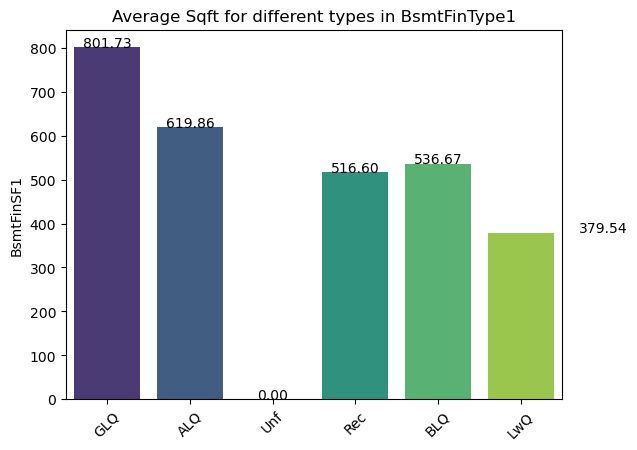

C:\Users\Joseph\AppData\Local\Temp\ipykernel_72872\3480867199.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = labels, y = Averages, palette = 'viridis')


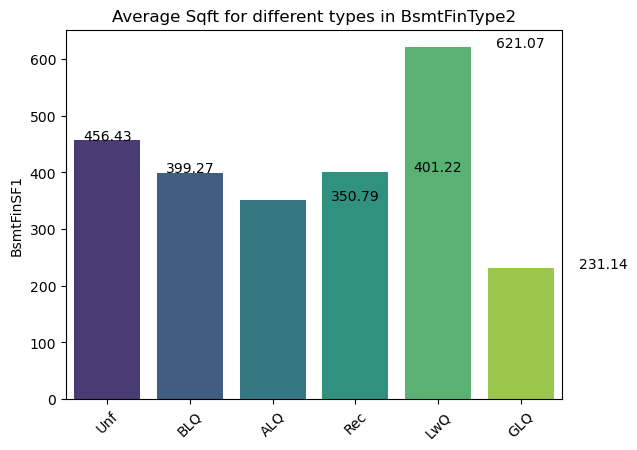

In [ ]:
for col in df[['BsmtFinType1','BsmtFinType2']]:
        labels = df[col].unique()
        Averages = []
        for label in labels:
                avg = df.loc[df[col] == label, "BsmtFinSF1"].mean()
                Averages.append(avg)

        for index, value in enumerate(Averages):
                plt.text(index, value + 0.5, f'{value:.2f}', ha='center')
        
        sns.barplot(x = labels, y = Averages, palette = 'viridis')
        plt.ylabel("BsmtFinSF1")
        plt.xticks(rotation = 45)
        plt.title(f"Average Sqft for different types in {col}")
        plt.show()


In [ ]:
df.loc[(df['BsmtFinType2'].isna()) & (~df['BsmtExposure'].isna()), 'BsmtFinType2'] = 'Unf' # Replace Nan value with 'Unf'
df[BsmtAttributes].iloc[332]

BsmtQual          Gd
BsmtCond          TA
BsmtExposure      No
BsmtFinType1     GLQ
BsmtFinSF1      1124
BsmtFinType2     Unf
BsmtFinSF2       479
Name: 332, dtype: object

In [ ]:
df.loc[(~df['BsmtFinType2'].isna()) & (df['BsmtExposure'].isna()), 'BsmtExposure'] = 'Na' # Replace Nan value with 'Na'
df[BsmtAttributes].iloc[948]

BsmtQual         Gd
BsmtCond         TA
BsmtExposure     Na
BsmtFinType1    Unf
BsmtFinSF1        0
BsmtFinType2    Unf
BsmtFinSF2        0
Name: 948, dtype: object

In [ ]:
df.loc[(df['BsmtQual'].isna()) & (df['BsmtCond'].isna()) & (df['BsmtExposure'].isna()) & (df['BsmtFinType1'].isna()) & (df['BsmtFinType2'].isna()) & (df['BsmtFinSF1'] == 0) & (df['BsmtFinSF2'] == 0)]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
17,90,RL,72.0,10791,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,Shed,500,10,2006,WD,Normal,90000
39,90,RL,65.0,6040,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2008,WD,AdjLand,82000
90,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,7,2006,WD,Normal,109900
102,90,RL,64.0,7018,Pave,NaN,Reg,Bnk,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2009,WD,Alloca,118964
156,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2006,WD,Normal,109500
182,20,RL,60.0,9060,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,MnPrv,NaN,0,6,2007,WD,Normal,120000
259,20,RM,70.0,12702,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,12,2008,WD,Normal,97000
342,90,RL,NaN,8544,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,5,2006,WD,Normal,87500
362,85,RL,64.0,7301,Pave,NaN,Reg,Lvl,AllPub,Corner,...,0,NA,NaN,NaN,0,7,2009,ConLD,Normal,198500
371,50,RL,80.0,17120,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,7,2008,WD,Normal,134432


In [ ]:
df['BsmtCond'] = df['BsmtCond'].fillna('NA')
df['BsmtQual'] = df['BsmtQual'].fillna('NA')
df['BsmtExposure'] = df['BsmtExposure'].fillna('NA')
df['BsmtFinType1'] = df['BsmtFinType1'].fillna('NA')
df['BsmtFinType2'] = df['BsmtFinType2'].fillna('NA')

In [ ]:
df.loc[(df['BsmtExposure'].isna())]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [ ]:
for i in df.columns:
    x = df[i].isna().sum()
    if x > 0:
        print(f'{i}: {x}')

LotFrontage: 259
Alley: 1369
MasVnrType: 872
MasVnrArea: 8
FireplaceQu: 690
GarageType: 81
GarageYrBlt: 81
GarageFinish: 81
GarageQual: 81
GarageCond: 81
Fence: 1179
MiscFeature: 1406


In [ ]:
df.loc[(df['GarageType'].isna()) & (df['GarageYrBlt'].isna()) & (df['GarageFinish'].isna()) & (df['GarageQual'].isna()) & (df['GarageCond'].isna())]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
39,90,RL,65.0,6040,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2008,WD,AdjLand,82000
48,190,RM,33.0,4456,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,6,2009,New,Partial,113000
78,90,RL,72.0,10778,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,4,2010,WD,Normal,136500
88,50,C (all),105.0,8470,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NA,MnPrv,NaN,0,10,2009,ConLD,Abnorml,85000
89,20,RL,60.0,8070,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,8,2007,WD,Normal,123600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1349,70,RM,50.0,5250,Pave,Pave,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,12,2008,WD,Normal,122000
1407,20,RL,NaN,8780,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NA,MnPrv,NaN,0,3,2009,WD,Normal,112000
1449,180,RM,21.0,1533,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,8,2006,WD,Abnorml,92000
1450,90,RL,60.0,9000,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NA,NaN,NaN,0,9,2009,WD,Normal,136000


In [ ]:
GarageAttribute = df[['GarageType','GarageYrBlt','GarageFinish','GarageQual','GarageCond']].columns

for i in GarageAttribute:
    df[i] = df[i].fillna('NA')

In [ ]:
for i in df.columns:
    x = df[i].isna().sum()
    if x > 0:
        print(f'{i}: {x}')

LotFrontage: 259
Alley: 1369
MasVnrType: 872
MasVnrArea: 8
FireplaceQu: 690
Fence: 1179
MiscFeature: 1406


In [ ]:
df.loc[(df['FireplaceQu'].isna()) & (df['Fireplaces'] == 0)]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,2,2008,WD,Normal,208500
5,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NA,MnPrv,Shed,700,10,2009,WD,Normal,143000
10,20,RL,70.0,11200,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,2,2008,WD,Normal,129500
12,20,RL,NaN,12968,Pave,NaN,IR2,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,9,2008,WD,Normal,144000
15,45,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Corner,...,0,NA,GdPrv,NaN,0,7,2007,WD,Normal,132000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,5,2006,WD,Normal,145000
1453,20,RL,90.0,17217,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,7,2006,WD,Abnorml,84500
1454,20,FV,62.0,7500,Pave,Pave,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,10,2009,WD,Normal,185000
1458,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,4,2010,WD,Normal,142125


In [ ]:
df['FireplaceQu'] = df['FireplaceQu'].fillna('NA')

In [ ]:
df.groupby(['Alley','Street']).size()

Alley  Street
Grvl   Pave      50
Pave   Pave      41
dtype: int64

In [ ]:
df['Street'].unique()

array(['Pave', 'Grvl'], dtype=object)

In [ ]:
df.loc[df['Street'] == 'Grvl']

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
52,90,RM,110.0,8472,Grvl,NaN,IR2,Bnk,AllPub,Corner,...,0,NA,NaN,NaN,0,5,2010,WD,Normal,110000
335,190,RL,NaN,164660,Grvl,NaN,IR1,HLS,AllPub,Corner,...,0,NA,NaN,Shed,700,8,2008,WD,Normal,228950
582,90,RL,81.0,11841,Grvl,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,5,2007,WD,Normal,118500
812,20,C (all),66.0,8712,Grvl,NaN,Reg,Bnk,AllPub,Inside,...,0,NA,NaN,Shed,54,6,2010,WD,Alloca,55993
1061,30,C (all),120.0,18000,Grvl,NaN,Reg,Low,AllPub,Inside,...,0,NA,NaN,Shed,560,8,2008,ConLD,Normal,81000
1184,20,RL,50.0,35133,Grvl,NaN,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,5,2007,WD,Normal,186700


In [ ]:
df['Alley'] = df['Alley'].fillna('NA')

In [ ]:
for i in df.columns:
    x = df[i].isna().sum()
    if x > 0:
        print(f'{i}: {x}')

LotFrontage: 259
MasVnrType: 872
MasVnrArea: 8
Fence: 1179
MiscFeature: 1406


In [ ]:
df[['MasVnrType','MasVnrArea']].loc[(df['MasVnrType'].isna()) & (df['MasVnrArea'].isna())]

,MasVnrType,MasVnrArea
234,NaN,NaN
529,NaN,NaN
650,NaN,NaN
936,NaN,NaN
973,NaN,NaN
977,NaN,NaN
1243,NaN,NaN
1278,NaN,NaN


In [ ]:
df['MasVnrArea'] = df['MasVnrArea'].fillna(0)

In [ ]:
df[['MasVnrType','MasVnrArea']].loc[df['MasVnrType'].isna()].describe(include='all')

,MasVnrType,MasVnrArea
count,0,872.000000
unique,0,NaN
top,NaN,NaN
freq,NaN,NaN
mean,NaN,1.084862
std,NaN,18.484478
min,NaN,0.000000
25%,NaN,0.000000
50%,NaN,0.000000
75%,NaN,0.000000


In [ ]:
df[['MasVnrType','MasVnrArea']].loc[(df['MasVnrType'].isna()) & (df['MasVnrArea'] == 0)]

,MasVnrType,MasVnrArea
1,NaN,0.0
3,NaN,0.0
5,NaN,0.0
8,NaN,0.0
9,NaN,0.0
...,...,...
1454,NaN,0.0
1455,NaN,0.0
1457,NaN,0.0
1458,NaN,0.0


In [ ]:
df.loc[(df['MasVnrType'].isna()) & (df['MasVnrArea'] == 0), 'MasVnrType'] = 'None'

In [ ]:
for i in df.columns:
    x = df[i].isna().sum()
    if x > 0:
        print(f'{i}: {x}')

LotFrontage: 259
MasVnrType: 5
Fence: 1179
MiscFeature: 1406


In [ ]:
df[['MasVnrType','MasVnrArea']].loc[df['MasVnrType'].isna()]

,MasVnrType,MasVnrArea
624,NaN,288.0
773,NaN,1.0
1230,NaN,1.0
1300,NaN,344.0
1334,NaN,312.0


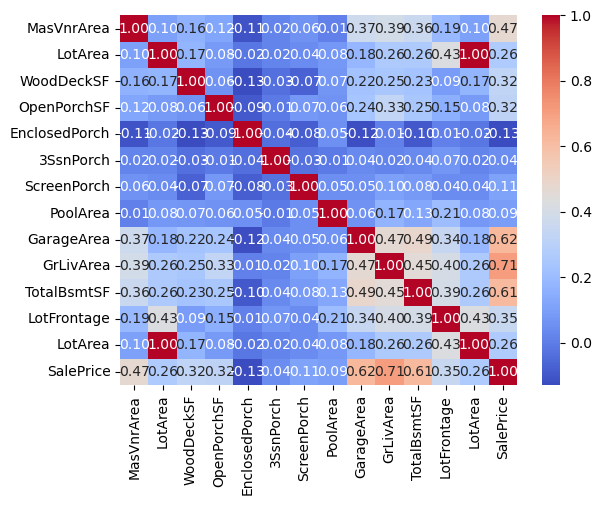

In [ ]:
df_area_corr = df[['MasVnrArea','LotArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','GarageArea','GrLivArea','TotalBsmtSF','LotFrontage','LotArea','SalePrice']].corr()

sns.heatmap(df_area_corr, cmap='coolwarm', annot=True, fmt=".2f")
plt.show()

<Axes: xlabel='LotFrontage', ylabel='LotArea'>

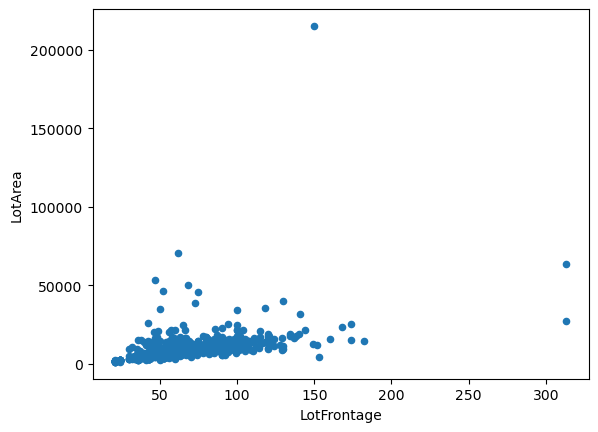

In [ ]:
df.plot(kind='scatter', x='LotFrontage',y='LotArea')

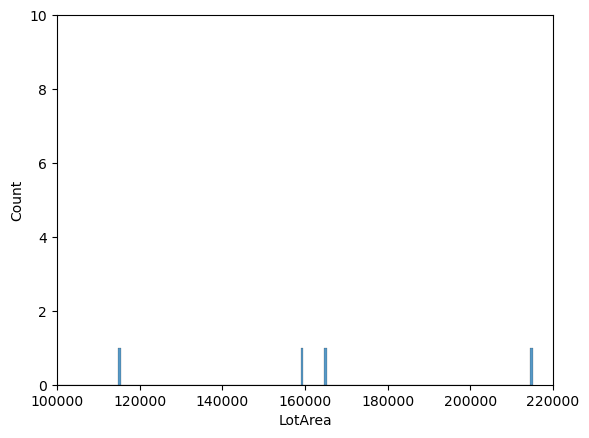

In [ ]:
sns.histplot(data=df,x='LotArea',stat='count')
plt.xlim(100000,220000)
plt.ylim(0, 10)
plt.show()

<Axes: xlabel='SalePrice', ylabel='LotArea'>

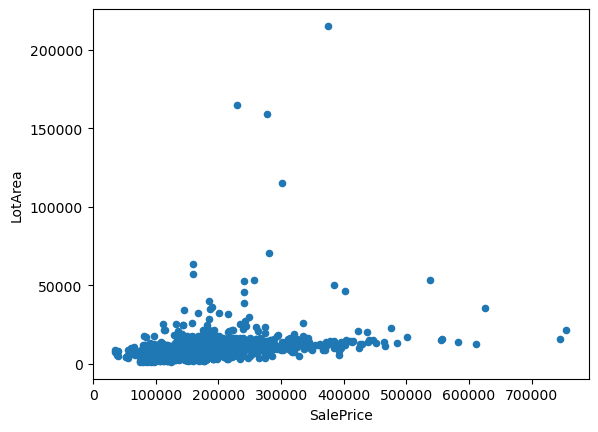

In [ ]:
df.plot(kind='scatter',x='SalePrice',y='LotArea')

<Axes: xlabel='SalePrice', ylabel='LotFrontage'>

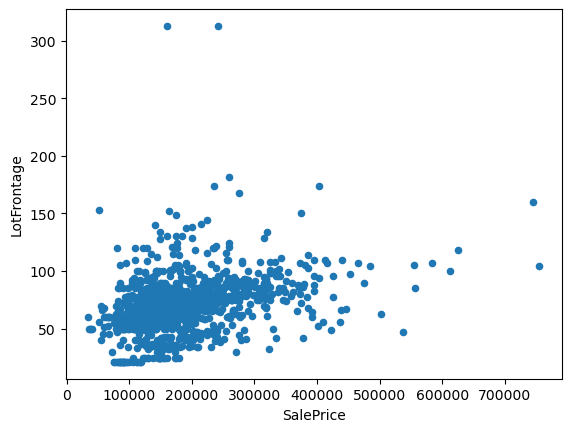

In [ ]:
df.plot(kind='scatter',x='SalePrice',y='LotFrontage')

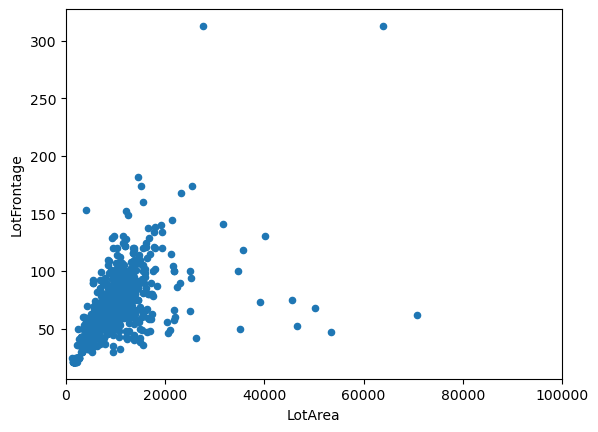

In [ ]:
df.plot(kind='scatter',y='LotFrontage',x='LotArea')
plt.xlim(0,100000)
plt.show()

In [ ]:
df_vernerType = df[df['MasVnrArea'] > 280]


In [ ]:
df_vernerType['MasVnrType'].value_counts()

MasVnrType
BrkFace    155
Stone       37
BrkCmn       5
Name: count, dtype: int64

In [ ]:
df[df['LotFrontage'].isna()]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
7,60,RL,NaN,10382,Pave,NA,IR1,Lvl,AllPub,Corner,...,0,NA,NaN,Shed,350,11,2009,WD,Normal,200000
12,20,RL,NaN,12968,Pave,NA,IR2,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,9,2008,WD,Normal,144000
14,20,RL,NaN,10920,Pave,NA,IR1,Lvl,AllPub,Corner,...,0,NA,GdWo,NaN,0,5,2008,WD,Normal,157000
16,20,RL,NaN,11241,Pave,NA,IR1,Lvl,AllPub,CulDSac,...,0,NA,NaN,Shed,700,3,2010,WD,Normal,149000
24,20,RL,NaN,8246,Pave,NA,IR1,Lvl,AllPub,Inside,...,0,NA,MnPrv,NaN,0,5,2010,WD,Normal,154000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1429,20,RL,NaN,12546,Pave,NA,IR1,Lvl,AllPub,Corner,...,0,NA,NaN,NaN,0,4,2007,WD,Normal,182900
1431,120,RL,NaN,4928,Pave,NA,IR1,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,10,2009,WD,Normal,143750
1441,120,RM,NaN,4426,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,5,2008,WD,Normal,149300
1443,30,RL,NaN,8854,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,NA,NaN,NaN,0,5,2009,WD,Normal,121000


C:\Users\Joseph\AppData\Local\Temp\ipykernel_72872\3966048769.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = labels, y = Averages, palette = 'viridis')


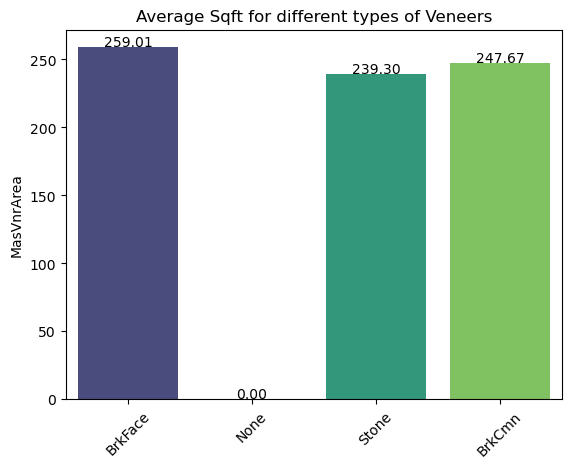

In [ ]:

labels = df['MasVnrType'].unique()
Averages = []
for label in labels:
        avg = df.loc[df['MasVnrType'] == label, "MasVnrArea"].mean()
        Averages.append(avg)

for index, value in enumerate(Averages):
        plt.text(index, value + 0.5, f'{value:.2f}', ha='center')

sns.barplot(x = labels, y = Averages, palette = 'viridis')
plt.ylabel("MasVnrArea")
plt.xticks(rotation = 45)
plt.title(f"Average Sqft for different types of Veneers")
plt.show()

In [ ]:
Test_unseen = df.loc[df['MasVnrType'].isna()]
Test_df = df.drop([624,773,1230,1300,1334], axis=0)

In [ ]:
y = df['MasVnrType']
X = df.drop('MasVnrType', axis=1)
X_train,x_test,y_train,y_test = train_test_split(X,y,random_state=100,test_size=0.3)

In [ ]:
df['LotFrontage'] = df['LotFrontage'].fillna(70.05)

In [ ]:
df.loc[(df['MasVnrType'].isna()) & (df['MasVnrArea'] > 1), 'MasVnrType'] = 'BrkFace'

In [ ]:
df['Fence'] = df['Fence'].fillna('NA')
df['MiscFeature'] = df['MiscFeature'].fillna('NA')

In [ ]:
df.loc[df['MasVnrType'].isna(), 'MasVnrArea'] = 0
df.loc[df['MasVnrType'].isna(), 'MasVnrType'] = 'None'


In [ ]:
for i in df.columns:
    x = df[i].isna().sum()
    if x > 0:
        print(f'{i}: {x}')

In [ ]:
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,NA,NA,NA,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NA,Reg,Lvl,AllPub,FR2,...,0,NA,NA,NA,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NA,IR1,Lvl,AllPub,Inside,...,0,NA,NA,NA,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NA,IR1,Lvl,AllPub,Corner,...,0,NA,NA,NA,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NA,IR1,Lvl,AllPub,FR2,...,0,NA,NA,NA,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,NA,NA,NA,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,NA,MnPrv,NA,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,NA,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,NA,NA,NA,0,4,2010,WD,Normal,142125


In [ ]:
df[['BsmtFinType1','BsmtFinType2','BsmtUnfSF']].loc[(df['BsmtUnfSF'] > 0) & (df['BsmtFinType1'] != 'Unf') & (df['BsmtFinType2'] != 'Unf')] # Find finished basements with unfinished area

,BsmtFinType1,BsmtFinType2,BsmtUnfSF
7,ALQ,BLQ,216
24,Rec,ALQ,204
26,BLQ,Rec,180
43,LwQ,BLQ,167
44,ALQ,BLQ,465
...,...,...,...
1418,BLQ,Rec,247
1424,ALQ,Rec,193
1439,GLQ,Rec,114
1456,ALQ,Rec,589


In [ ]:
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,NA,NA,NA,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NA,Reg,Lvl,AllPub,FR2,...,0,NA,NA,NA,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NA,IR1,Lvl,AllPub,Inside,...,0,NA,NA,NA,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NA,IR1,Lvl,AllPub,Corner,...,0,NA,NA,NA,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NA,IR1,Lvl,AllPub,FR2,...,0,NA,NA,NA,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,NA,NA,NA,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,NA,MnPrv,NA,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,NA,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,NA,NA,NA,0,4,2010,WD,Normal,142125


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [ ]:
df_obj = df.select_dtypes(include='object').columns
df_obj

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC',
       'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'],
      dtype='object')

In [ ]:
df_numeric = df.select_dtypes(include=['int', 'float']).columns
df_numeric

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [ ]:
df_corr = df[df_numeric].corr()
df_corr

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.357056,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.023573,-0.069836,-0.065649,...,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284
LotFrontage,-0.357056,1.000000,0.306795,0.234196,-0.052820,0.117598,0.082746,0.178699,0.215828,0.043340,...,0.077106,0.137455,0.009790,0.062335,0.037684,0.180868,0.001168,0.010158,0.006768,0.334901
LotArea,-0.139781,0.306795,1.000000,0.105806,-0.005636,0.014228,0.013788,0.103317,0.214103,0.111170,...,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
OverallQual,0.032628,0.234196,0.105806,1.000000,-0.091932,0.572323,0.550684,0.407256,0.239666,-0.059119,...,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,0.790982
OverallCond,-0.059316,-0.052820,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.125689,-0.046231,0.040229,...,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,-0.077856
YearBuilt,0.027850,0.117598,0.014228,0.572323,-0.375983,1.000000,0.592855,0.311600,0.249503,-0.049107,...,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,0.040581,0.082746,0.013788,0.550684,0.073741,0.592855,1.000000,0.176535,0.128451,-0.067759,...,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,0.023573,0.178699,0.103317,0.407256,-0.125689,0.311600,0.176535,1.000000,0.261254,-0.071332,...,0.159991,0.122532,-0.109913,0.019145,0.062249,0.011929,-0.029575,-0.006726,-0.008312,0.472615
BsmtFinSF1,-0.069836,0.215828,0.214103,0.239666,-0.046231,0.249503,0.128451,0.261254,1.000000,-0.050117,...,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,-0.015727,0.014359,0.386420
BsmtFinSF2,-0.065649,0.043340,0.111170,-0.059119,0.040229,-0.049107,-0.067759,-0.071332,-0.050117,1.000000,...,0.067898,0.003093,0.036543,-0.029993,0.088871,0.041709,0.004940,-0.015211,0.031706,-0.011378


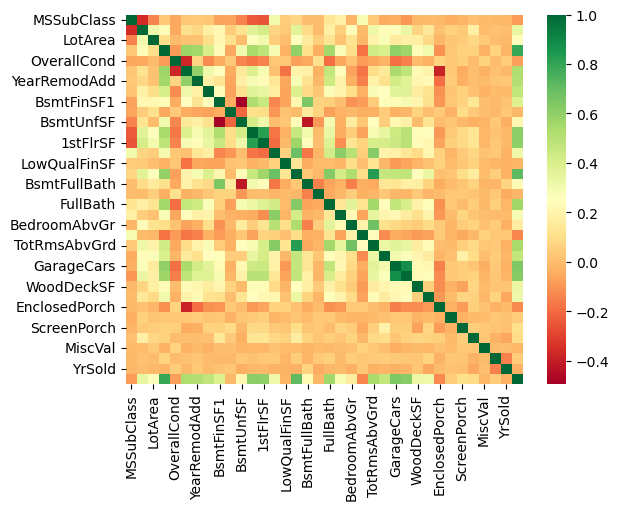

In [ ]:
sns.heatmap(df_corr, cmap='RdYlGn')
plt.show()

In [ ]:
PairNo = 1
cols = list(df_numeric)
PairListing = []

for i in range(len(cols)):
    for j in range(i + 1, len(cols)):   # ensures no duplicates, no self-pairs
        
        x_col = cols[i]
        y_col = cols[j]

        corr_value = df[[x_col, y_col]].corr().iloc[0, 1]

        if (abs(corr_value) >= 0.6) & (abs(corr_value) < 1):
            print(f"Pair {PairNo}: {x_col} - {y_col} || Correlation: {corr_value:.4f}")
            PairNo += 1

            if x_col not in PairListing:
                PairListing.append(x_col)
            if y_col not in PairListing:
                PairListing.append(y_col)




Pair 1: OverallQual - GarageCars || Correlation: 0.6007
Pair 2: OverallQual - SalePrice || Correlation: 0.7910
Pair 3: BsmtFinSF1 - BsmtFullBath || Correlation: 0.6492
Pair 4: TotalBsmtSF - 1stFlrSF || Correlation: 0.8195
Pair 5: TotalBsmtSF - SalePrice || Correlation: 0.6136
Pair 6: 1stFlrSF - SalePrice || Correlation: 0.6059
Pair 7: 2ndFlrSF - GrLivArea || Correlation: 0.6875
Pair 8: 2ndFlrSF - HalfBath || Correlation: 0.6097
Pair 9: 2ndFlrSF - TotRmsAbvGrd || Correlation: 0.6164
Pair 10: GrLivArea - FullBath || Correlation: 0.6300
Pair 11: GrLivArea - TotRmsAbvGrd || Correlation: 0.8255
Pair 12: GrLivArea - SalePrice || Correlation: 0.7086
Pair 13: BedroomAbvGr - TotRmsAbvGrd || Correlation: 0.6766
Pair 14: GarageCars - GarageArea || Correlation: 0.8825
Pair 15: GarageCars - SalePrice || Correlation: 0.6404
Pair 16: GarageArea - SalePrice || Correlation: 0.6234


In [ ]:
PairListing

['OverallQual',
 'GarageCars',
 'SalePrice',
 'BsmtFinSF1',
 'BsmtFullBath',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'GrLivArea',
 'HalfBath',
 'TotRmsAbvGrd',
 'FullBath',
 'BedroomAbvGr',
 'GarageArea']

In [ ]:
PairListing.remove('SalePrice')

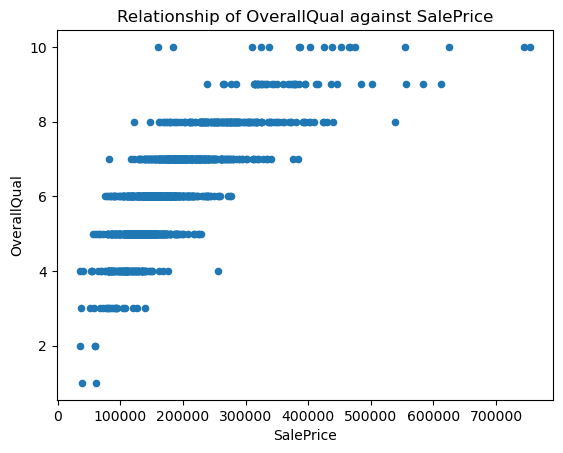

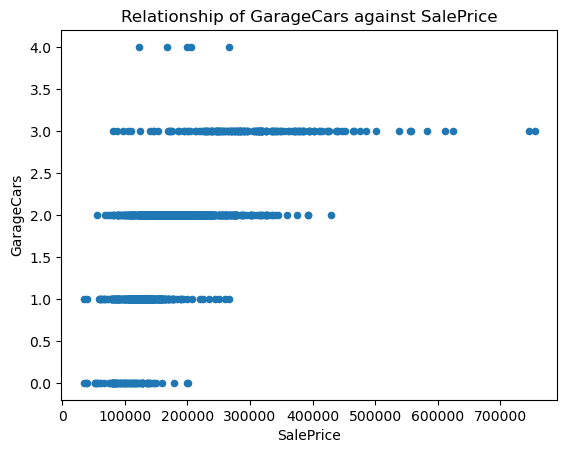

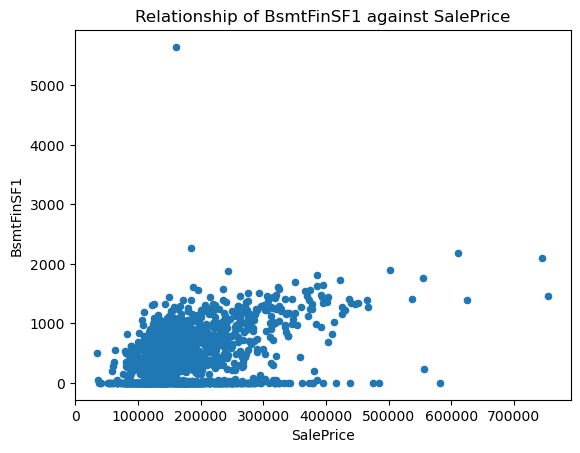

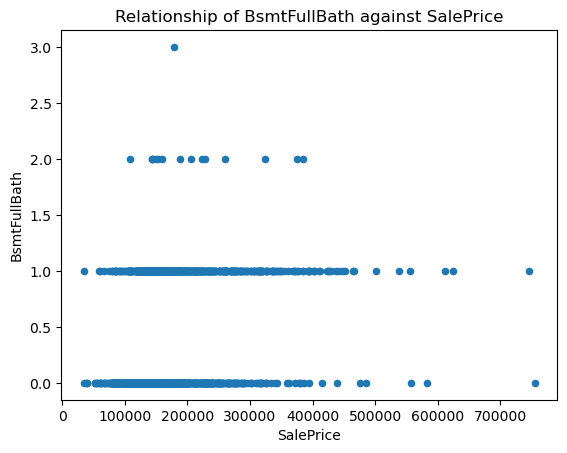

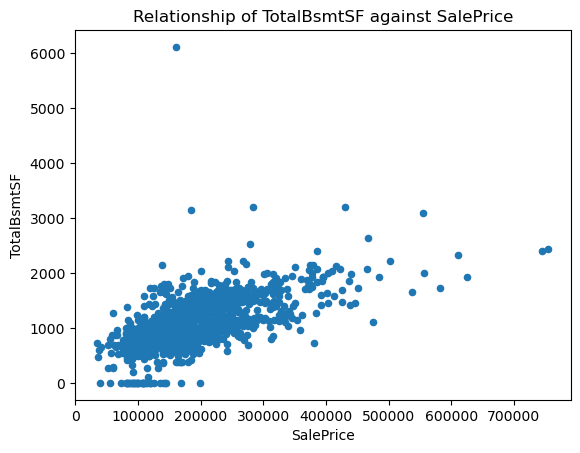

...

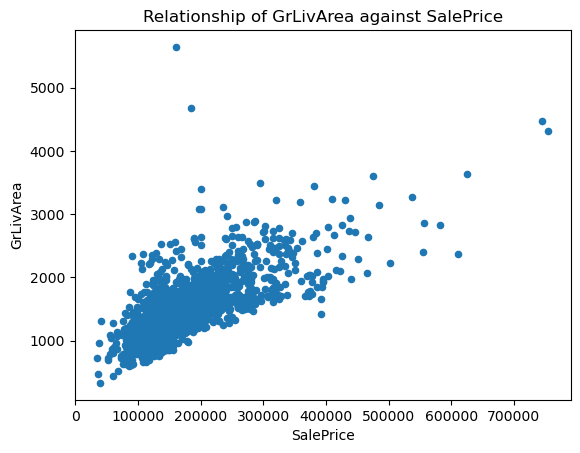

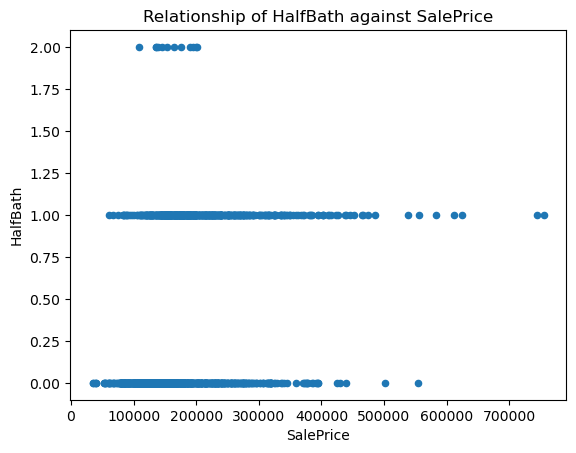

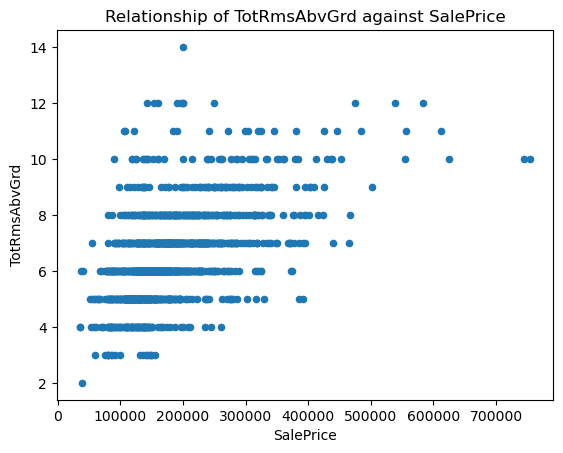

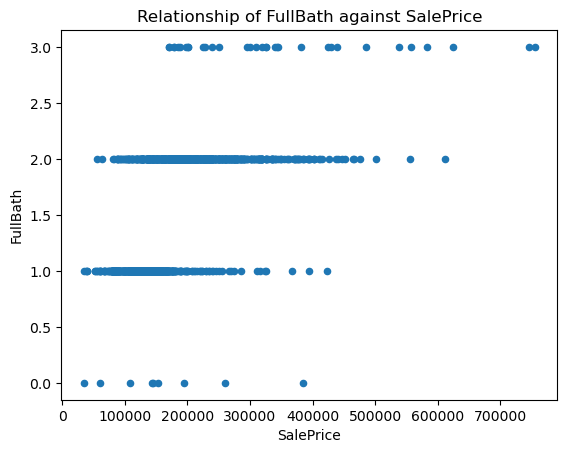

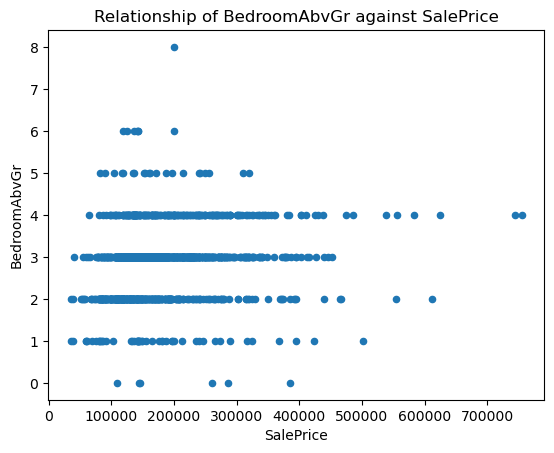

In [ ]:
for y in range(len(PairListing) - 1):
    df.plot(kind='scatter', y=PairListing[y], x='SalePrice')
    plt.title(f'Relationship of {PairListing[y]} against SalePrice')

<Axes: xlabel='TotalBsmtSF', ylabel='SalePrice'>

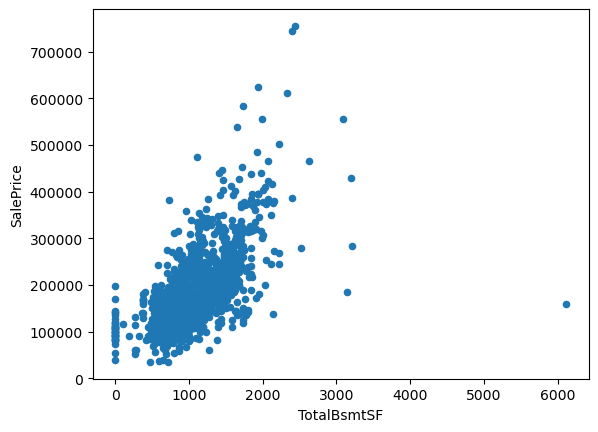

In [ ]:
df.plot(kind='scatter', x='TotalBsmtSF', y='SalePrice')

<Axes: xlabel='GrLivArea', ylabel='SalePrice'>

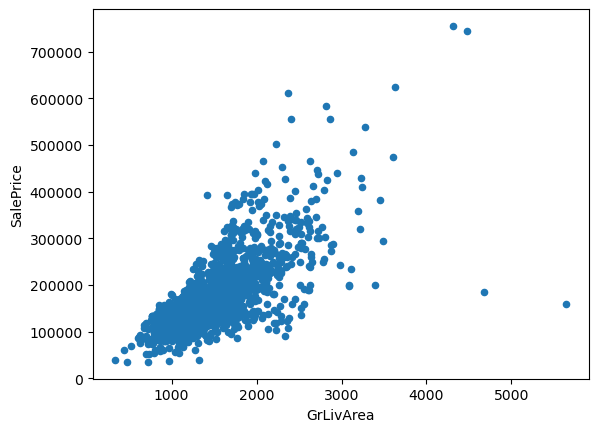

In [ ]:
df.plot(kind='scatter', x='GrLivArea', y='SalePrice')

In [ ]:
df_bsmt = df.columns[df.columns.str.contains('Bsmt')]

In [ ]:
df_garage = df.columns[df.columns.str.contains('Garage')]

In [ ]:
df_conditions = df.columns[df.columns.str.contains('Cond')]

In [ ]:
df['SalePriceLog'] = np.log(df['SalePrice'])

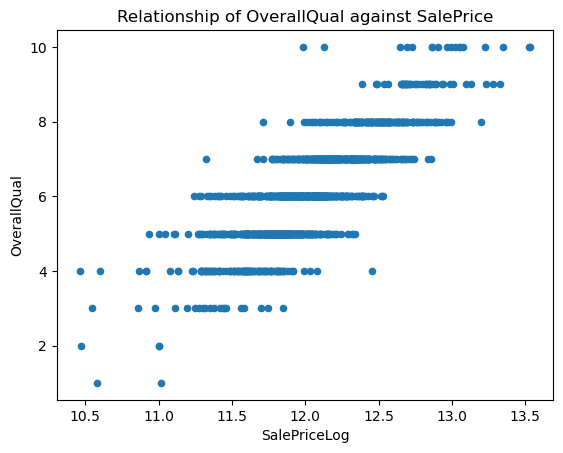

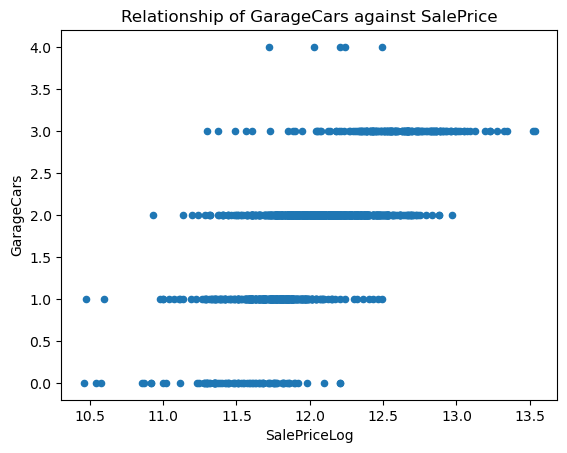

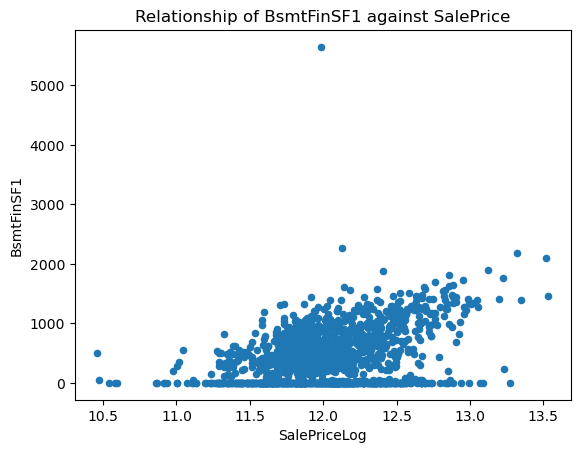

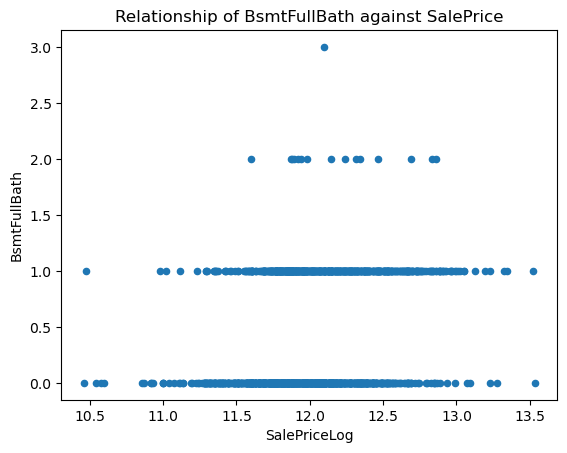

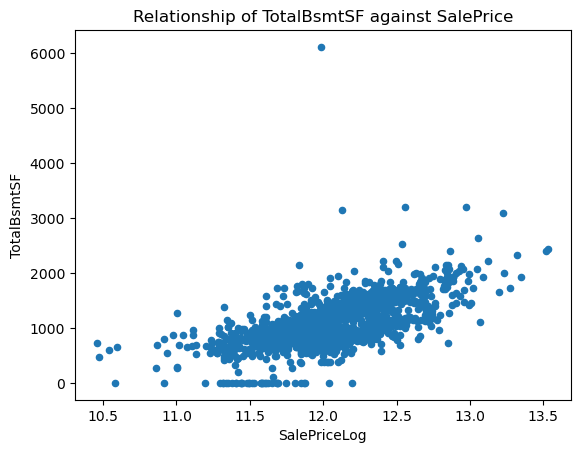

...

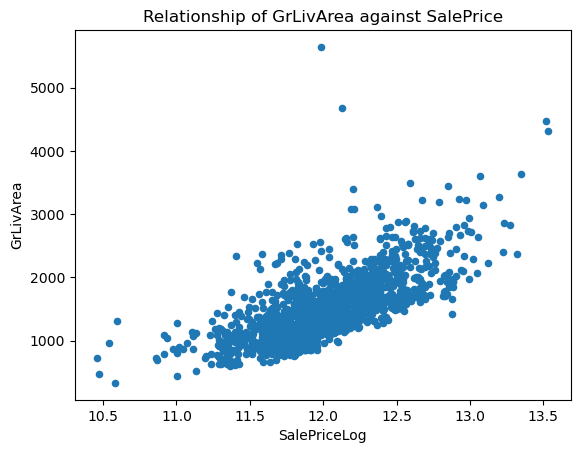

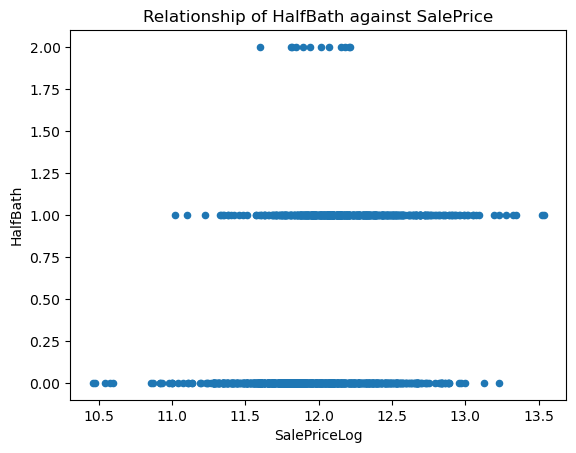

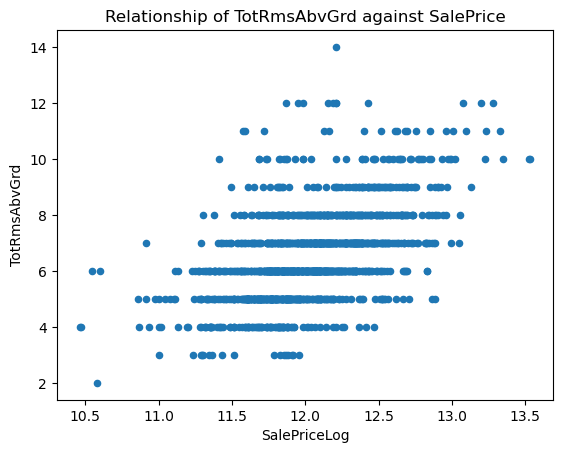

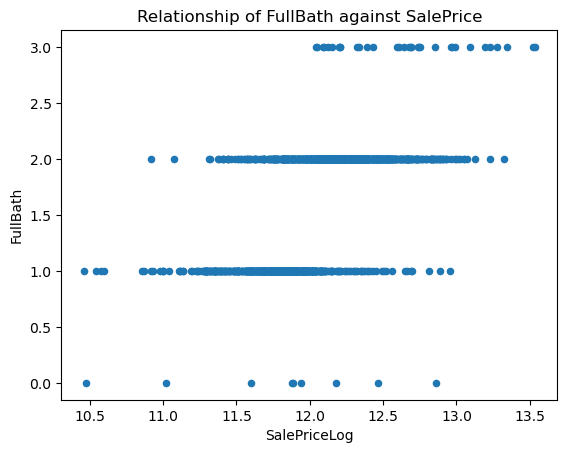

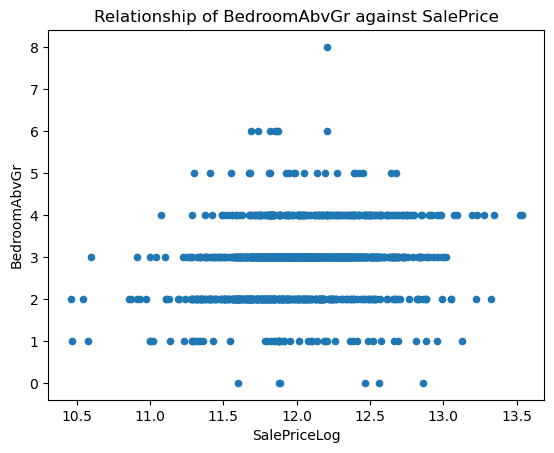

In [ ]:
for y in range(len(PairListing) - 1):
    df.plot(kind='scatter', y=PairListing[y], x='SalePriceLog')
    plt.title(f'Relationship of {PairListing[y]} against SalePrice')

In [ ]:
df_numeric = df.select_dtypes(include=['int', 'float']).columns
df_numeric

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice', 'SalePriceLog'],
      dtype='object')

In [ ]:
df_corr = df[df_numeric].corr()
df_corr

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,SalePriceLog
MSSubClass,1.000000,-0.357056,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.023573,-0.069836,-0.065649,...,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284,-0.073959
LotFrontage,-0.357056,1.000000,0.306795,0.234196,-0.052820,0.117598,0.082746,0.178699,0.215828,0.043340,...,0.137455,0.009790,0.062335,0.037684,0.180868,0.001168,0.010158,0.006768,0.334901,0.336156
LotArea,-0.139781,0.306795,1.000000,0.105806,-0.005636,0.014228,0.013788,0.103317,0.214103,0.111170,...,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843,0.257320
OverallQual,0.032628,0.234196,0.105806,1.000000,-0.091932,0.572323,0.550684,0.407256,0.239666,-0.059119,...,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,0.790982,0.817184
OverallCond,-0.059316,-0.052820,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.125689,-0.046231,0.040229,...,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,-0.077856,-0.036868
YearBuilt,0.027850,0.117598,0.014228,0.572323,-0.375983,1.000000,0.592855,0.311600,0.249503,-0.049107,...,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897,0.586570
YearRemodAdd,0.040581,0.082746,0.013788,0.550684,0.073741,0.592855,1.000000,0.176535,0.128451,-0.067759,...,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101,0.565608
MasVnrArea,0.023573,0.178699,0.103317,0.407256,-0.125689,0.311600,0.176535,1.000000,0.261254,-0.071332,...,0.122532,-0.109913,0.019145,0.062249,0.011929,-0.029575,-0.006726,-0.008312,0.472615,0.426776
BsmtFinSF1,-0.069836,0.215828,0.214103,0.239666,-0.046231,0.249503,0.128451,0.261254,1.000000,-0.050117,...,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,-0.015727,0.014359,0.386420,0.372023
BsmtFinSF2,-0.065649,0.043340,0.111170,-0.059119,0.040229,-0.049107,-0.067759,-0.071332,-0.050117,1.000000,...,0.003093,0.036543,-0.029993,0.088871,0.041709,0.004940,-0.015211,0.031706,-0.011378,0.004832


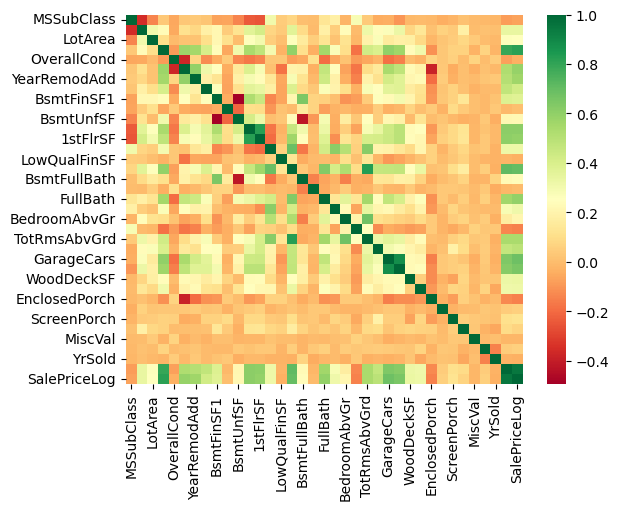

In [ ]:
sns.heatmap(df_corr, cmap='RdYlGn')
plt.show()

<Axes: title={'center': 'SalePriceLog'}, xlabel='SaleCondition'>

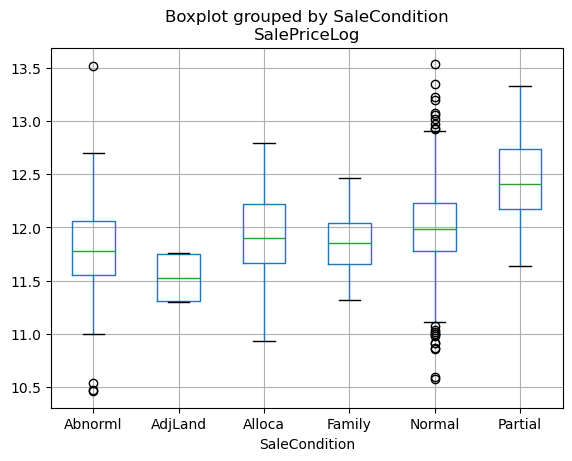

In [ ]:
df.boxplot(column='SalePriceLog', by='SaleCondition')

<Axes: title={'center': 'SalePriceLog'}, xlabel='OverallQual'>

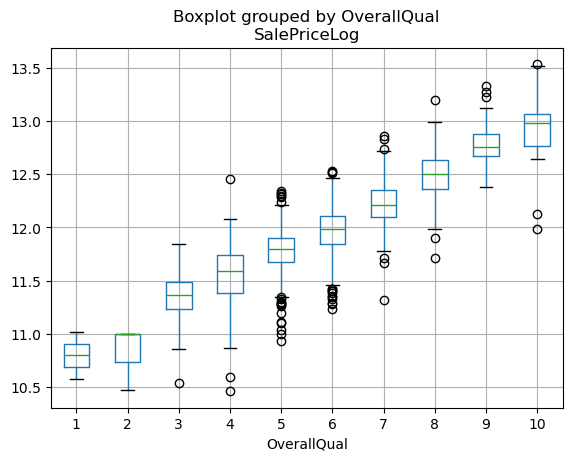

In [ ]:
df.boxplot(column='SalePriceLog', by='OverallQual')

<Axes: title={'center': 'SalePriceLog'}, xlabel='TotRmsAbvGrd'>

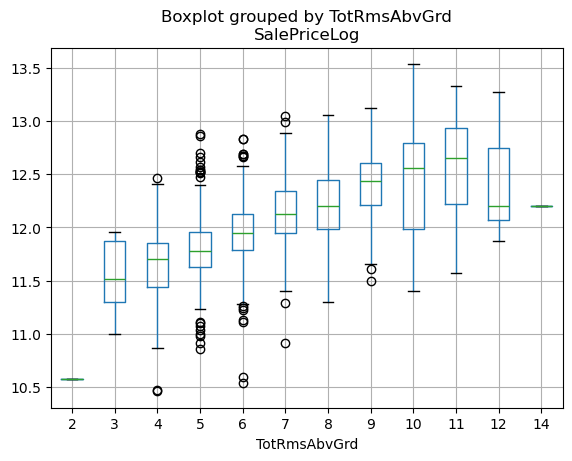

In [ ]:
df.boxplot(column='SalePriceLog', by='TotRmsAbvGrd')

<Axes: title={'center': 'SalePriceLog'}, xlabel='HalfBath'>

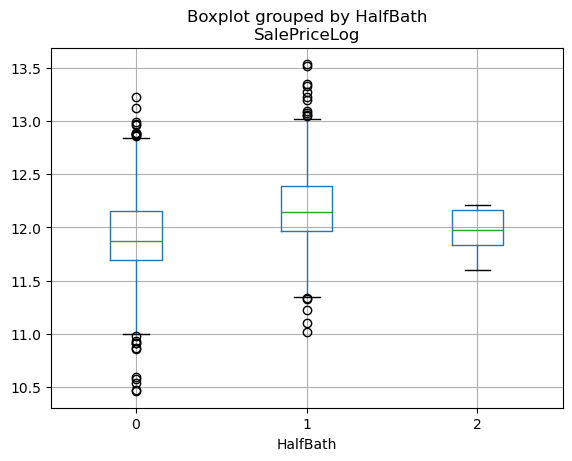

In [ ]:
df.boxplot(column='SalePriceLog', by='HalfBath')

c:\Users\Joseph\anaconda3\Lib\site-packages\pandas\plotting\_matplotlib\tools.py:233: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


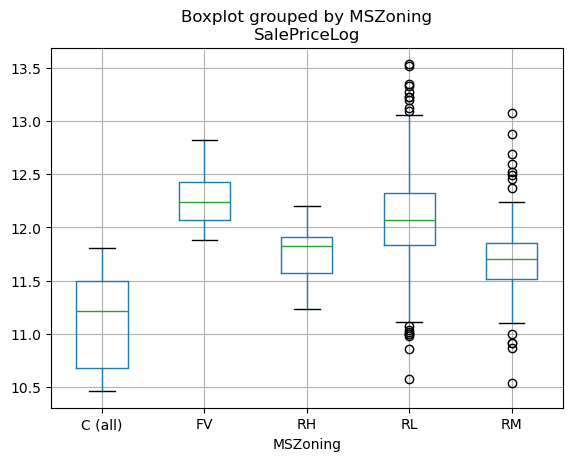

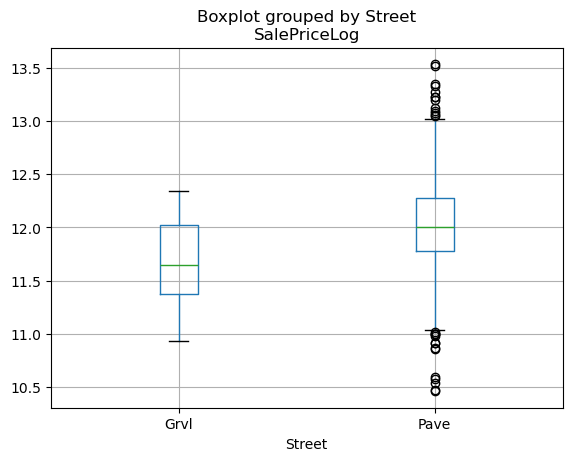

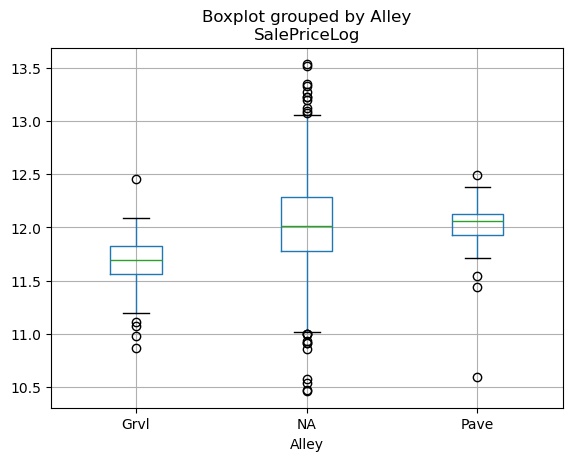

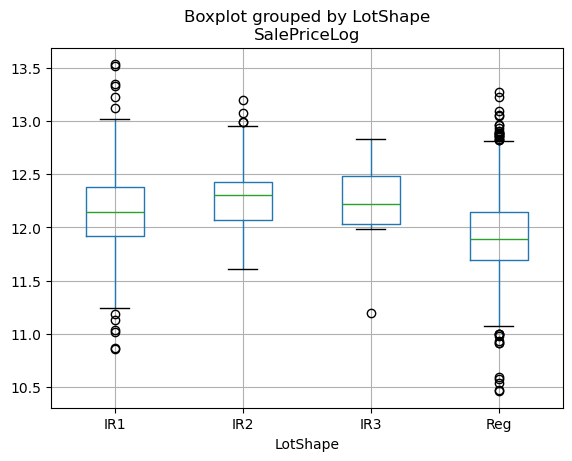

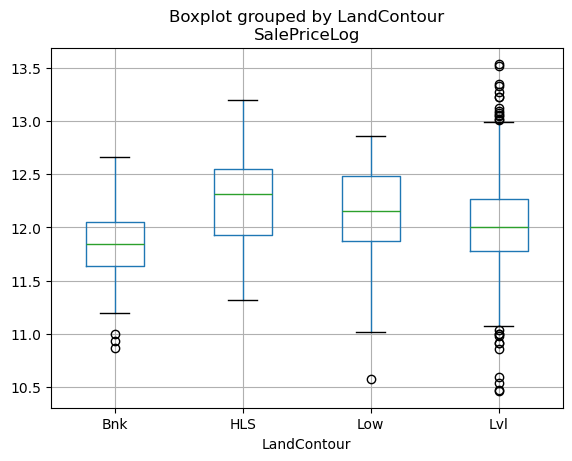

...

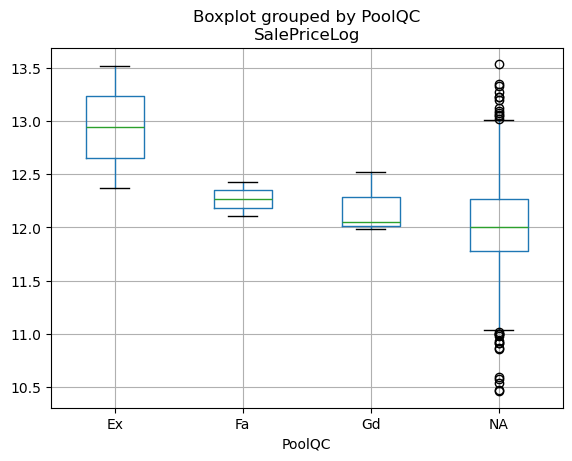

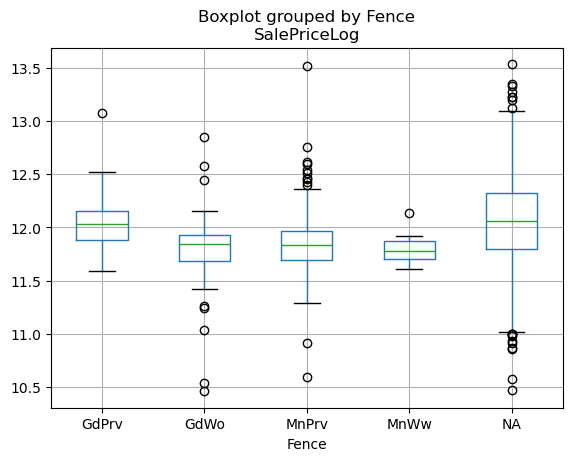

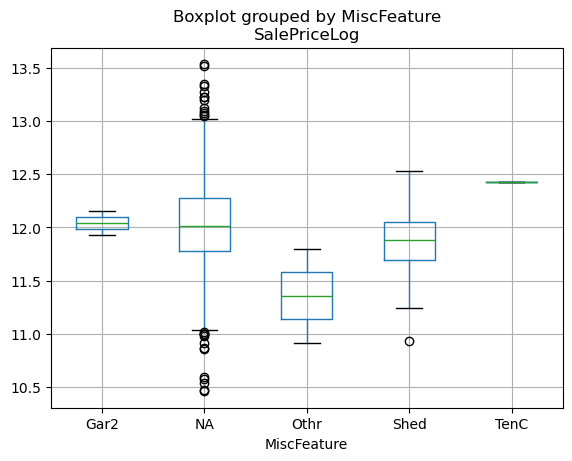

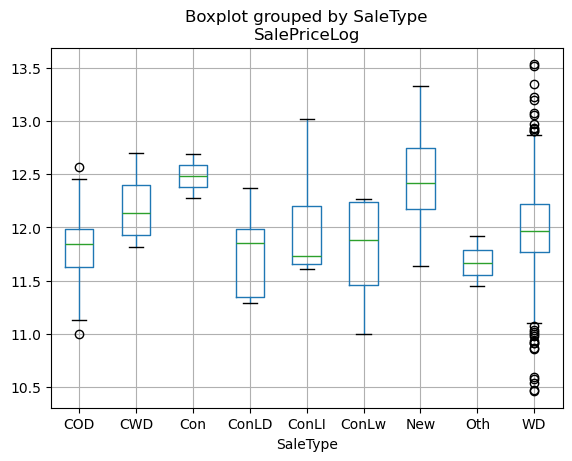

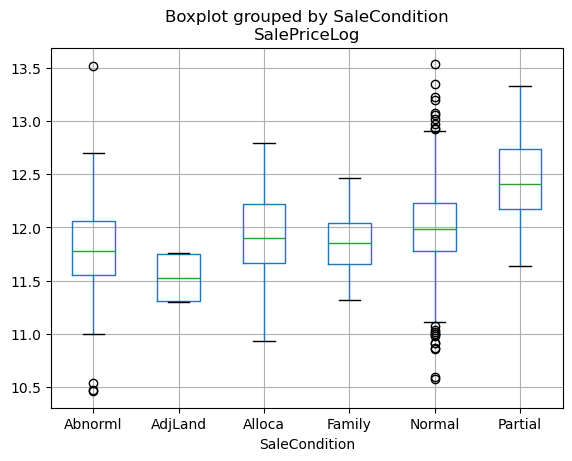

In [ ]:
for i in df_obj:
    df.boxplot(column='SalePriceLog', by=i)

<Axes: xlabel='SalePriceLog', ylabel='YrSold'>

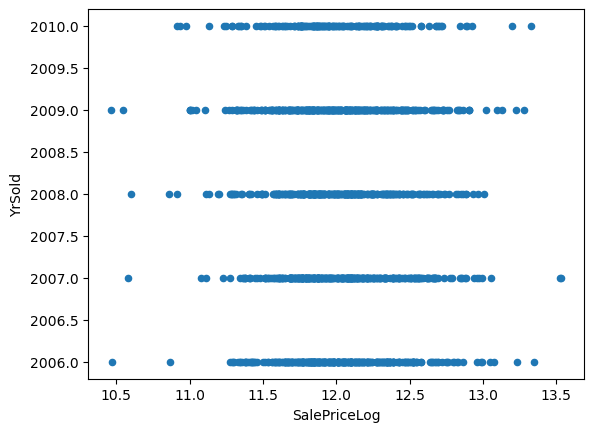

In [ ]:
df.plot(kind='scatter', x='SalePriceLog', y='YrSold')

<Axes: ylabel='Frequency'>

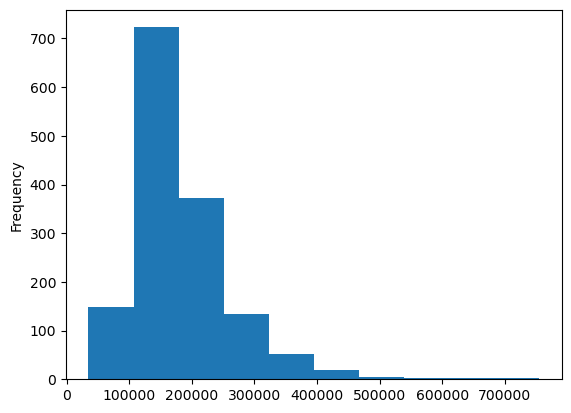

In [ ]:
df['SalePrice'].plot(kind='hist')

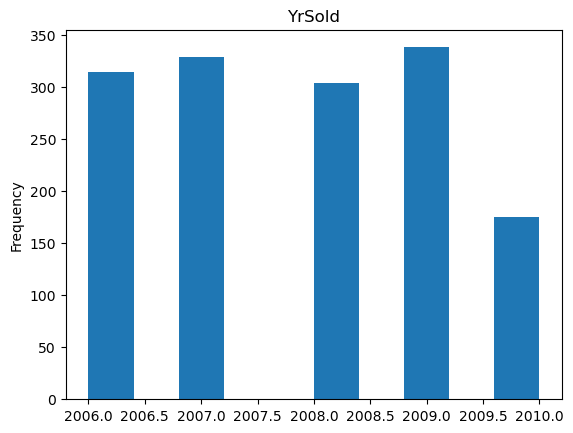

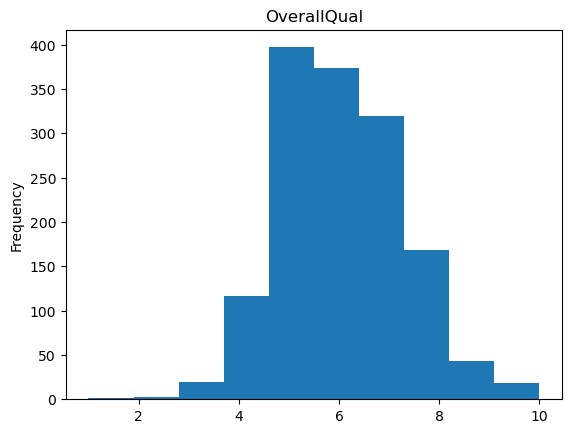

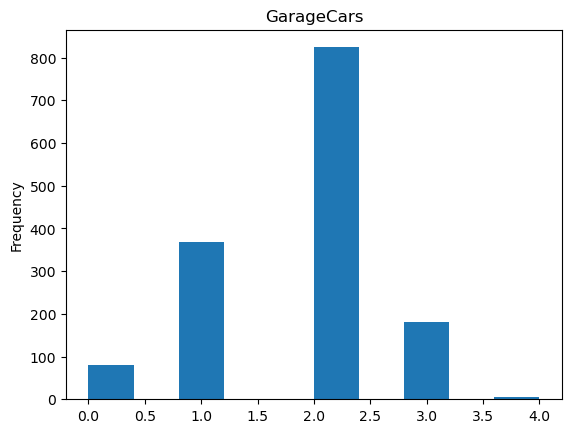

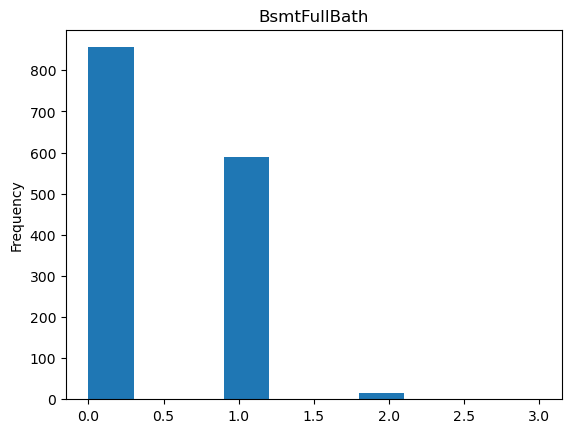

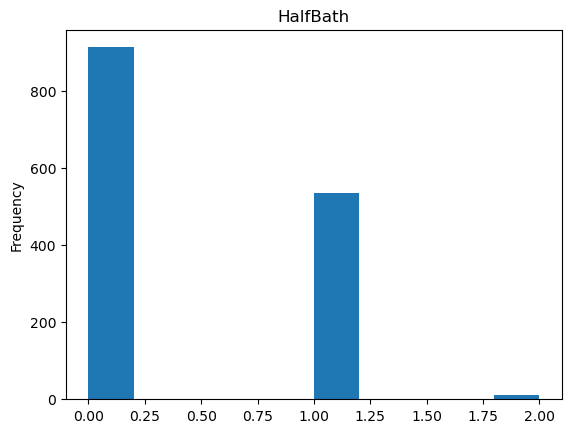

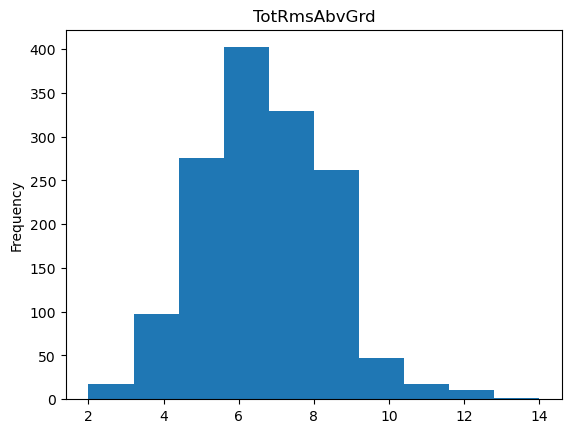

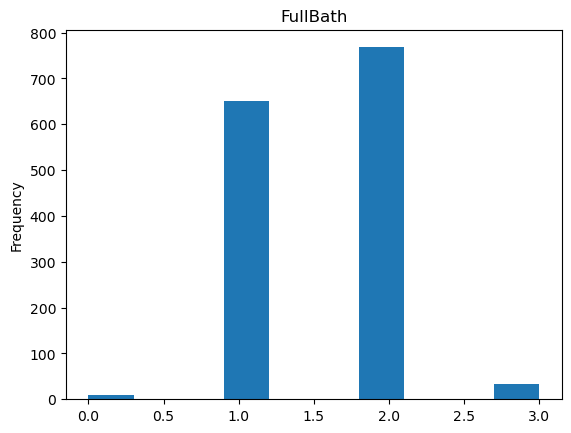

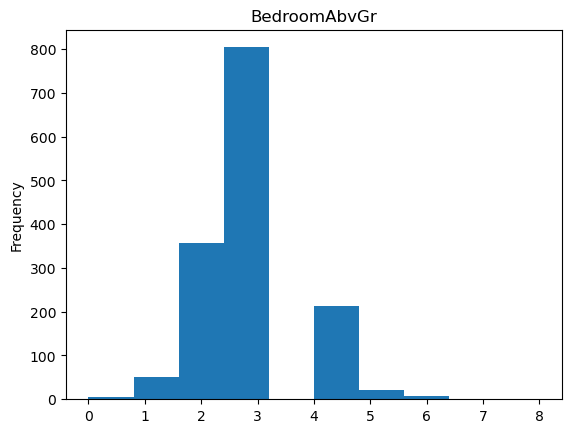

In [ ]:
df_numeric_cat = df[['YrSold','OverallQual','GarageCars','BsmtFullBath','HalfBath','TotRmsAbvGrd','FullBath','BedroomAbvGr']].columns

for column in df_numeric_cat:
    df[column].plot(kind='hist')
    plt.title(column)
    plt.show()

In [ ]:
df_garage_na = df[df['GarageYrBlt'] == 'NA']
df_garage_na[['YearBuilt', 'GarageYrBlt']]

,YearBuilt,GarageYrBlt
39,1955,NA
48,1920,NA
78,1968,NA
88,1915,NA
89,1994,NA
...,...,...
1349,1872,NA
1407,1985,NA
1449,1970,NA
1450,1974,NA


In [ ]:
df[df_garage].loc[df['GarageYrBlt'] == 'NA']

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
39,NA,NA,NA,0,0,NA,NA
48,NA,NA,NA,0,0,NA,NA
78,NA,NA,NA,0,0,NA,NA
88,NA,NA,NA,0,0,NA,NA
89,NA,NA,NA,0,0,NA,NA
...,...,...,...,...,...,...,...
1349,NA,NA,NA,0,0,NA,NA
1407,NA,NA,NA,0,0,NA,NA
1449,NA,NA,NA,0,0,NA,NA
1450,NA,NA,NA,0,0,NA,NA


In [ ]:
df_Garage = df[df_garage].loc[df['GarageYrBlt'] != 'NA']

In [ ]:
df_Garage.loc[df['GarageYrBlt'] == 'NA']

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond


In [ ]:
df_Garage.describe(include='all')

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
count,1379,1379.0,1379,1379.000000,1379.000000,1379,1379
unique,6,97.0,3,NaN,NaN,5,5
top,Attchd,2005.0,Unf,NaN,NaN,TA,TA
freq,870,65.0,605,NaN,NaN,1311,1326
mean,NaN,NaN,NaN,1.870921,500.762146,NaN,NaN
std,NaN,NaN,NaN,0.630055,185.680520,NaN,NaN
min,NaN,NaN,NaN,1.000000,160.000000,NaN,NaN
25%,NaN,NaN,NaN,1.000000,380.000000,NaN,NaN
50%,NaN,NaN,NaN,2.000000,484.000000,NaN,NaN
75%,NaN,NaN,NaN,2.000000,580.000000,NaN,NaN


In [ ]:
df_Garage['GarageYrBlt'] = df_Garage['GarageYrBlt'].astype('int')

In [ ]:
df_Garage['SalePriceLog'] = df['SalePriceLog']

<Axes: xlabel='GarageYrBlt', ylabel='SalePriceLog'>

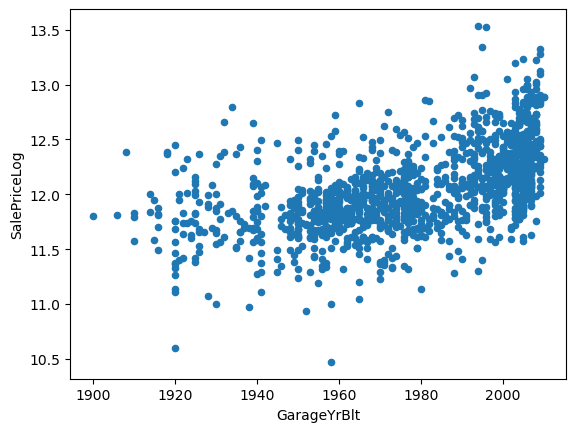

In [ ]:
df_Garage.plot(kind='scatter',y='SalePriceLog',x='GarageYrBlt', )

<Axes: xlabel='SalePriceLog', ylabel='GarageArea'>

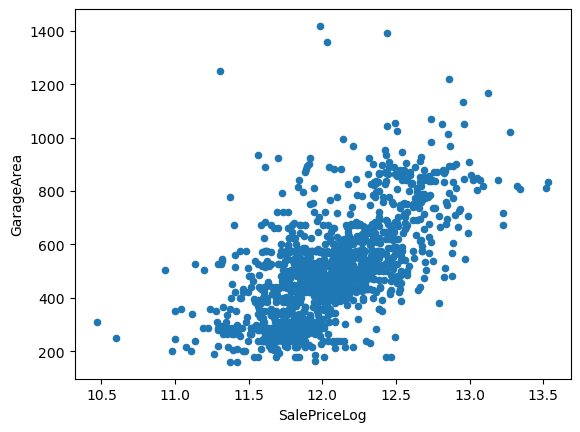

In [ ]:
df_Garage.plot(kind='scatter',x='SalePriceLog',y='GarageArea')

<Axes: title={'center': 'SalePriceLog'}, xlabel='GarageCars'>

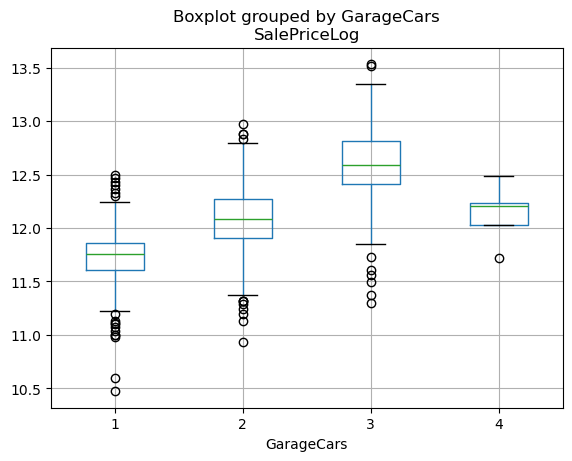

In [ ]:
df_Garage['GarageCars'] = df_Garage['GarageCars'].astype('int')

df_Garage.boxplot(by='GarageCars', column='SalePriceLog')

In [ ]:
df_Garage.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1379 entries, 0 to 1459
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   GarageType    1379 non-null   object 
 1   GarageYrBlt   1379 non-null   int64  
 2   GarageFinish  1379 non-null   object 
 3   GarageCars    1379 non-null   int64  
 4   GarageArea    1379 non-null   int64  
 5   GarageQual    1379 non-null   object 
 6   GarageCond    1379 non-null   object 
 7   SalePriceLog  1379 non-null   float64
dtypes: float64(1), int64(3), object(4)
memory usage: 97.0+ KB


<Axes: title={'center': 'SalePriceLog'}, xlabel='GarageQual'>

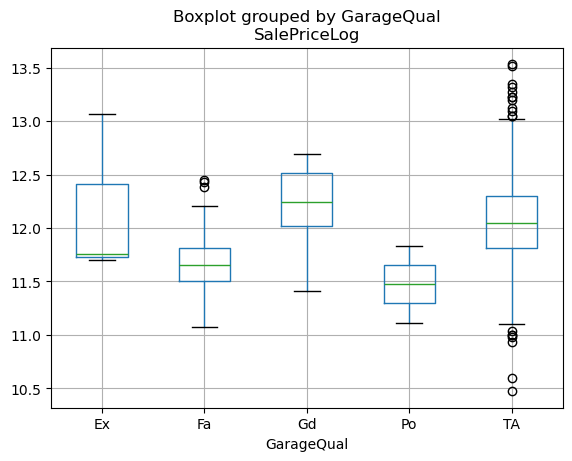

In [ ]:
df_Garage.boxplot(by='GarageQual', column='SalePriceLog')

<Axes: title={'center': 'SalePriceLog'}, xlabel='GarageCond'>

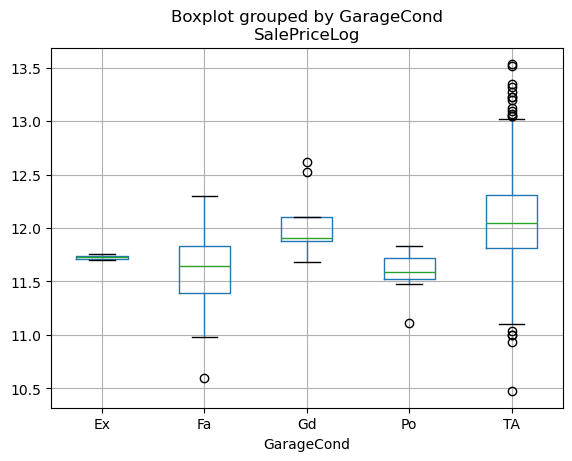

In [ ]:
df_Garage.boxplot(by='GarageCond', column='SalePriceLog')

<Axes: title={'center': 'SalePriceLog'}, xlabel='GarageType'>

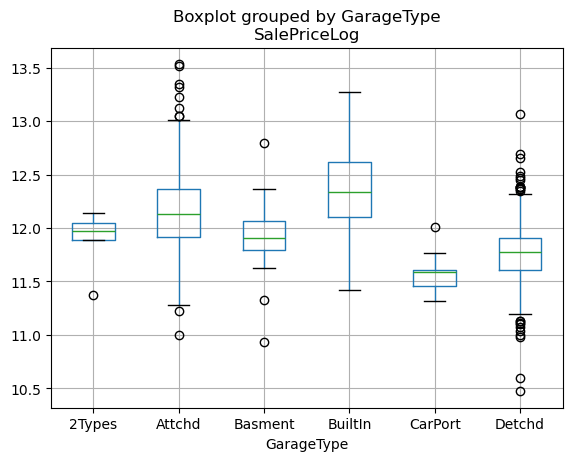

In [ ]:
df_Garage.boxplot(by='GarageType', column='SalePriceLog')

<Axes: title={'center': 'SalePriceLog'}, xlabel='GarageFinish'>

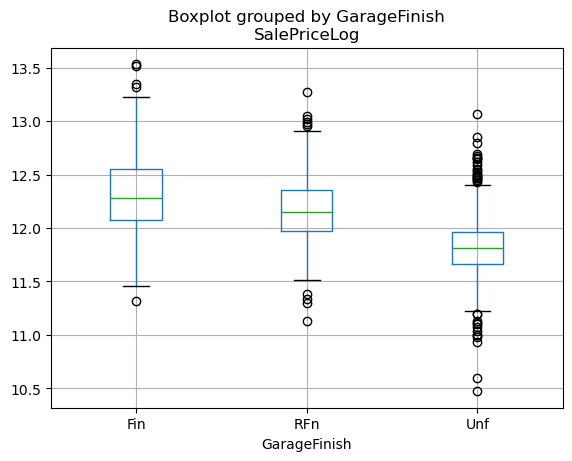

In [ ]:
df_Garage.boxplot(by='GarageFinish', column='SalePriceLog')

<Axes: title={'center': 'SalePriceLog'}, xlabel='YrSold'>

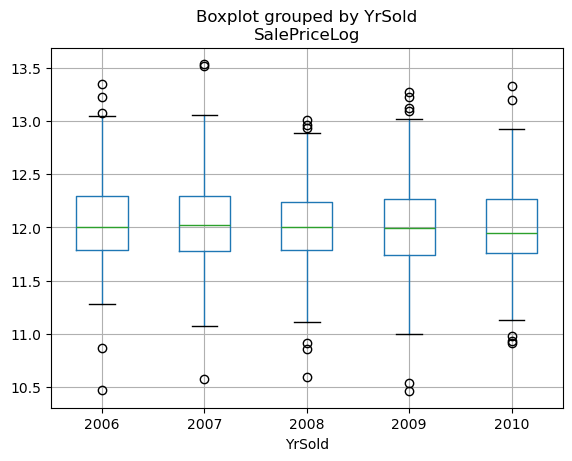

In [ ]:
df.boxplot(by='YrSold', column='SalePriceLog')

<Axes: title={'center': 'SalePriceLog'}, xlabel='MoSold'>

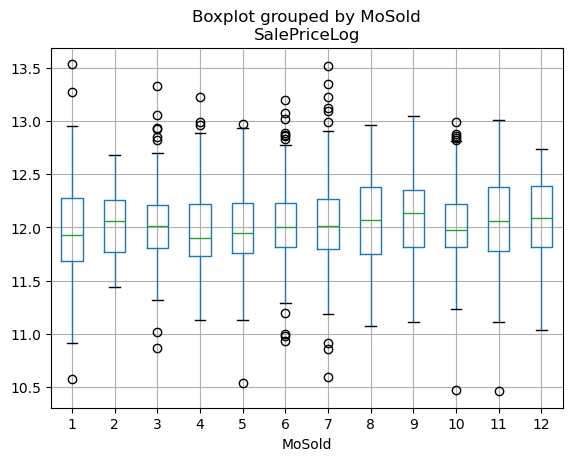

In [ ]:
df.boxplot(by='MoSold', column='SalePriceLog')

<Axes: title={'center': 'SalePriceLog'}, xlabel='SaleType'>

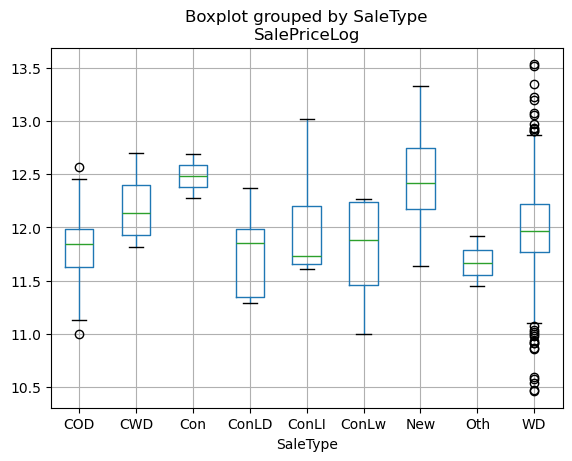

In [ ]:
df.boxplot(by='SaleType', column='SalePriceLog')

In [ ]:
df = df.drop(['YrSold', 'MoSold', 'GarageYrBlt'], axis=1)
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,SaleType,SaleCondition,SalePrice,SalePriceLog
0,60,RL,65.0,8450,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,0,NA,NA,NA,0,WD,Normal,208500,12.247694
1,20,RL,80.0,9600,Pave,NA,Reg,Lvl,AllPub,FR2,...,0,0,NA,NA,NA,0,WD,Normal,181500,12.109011
2,60,RL,68.0,11250,Pave,NA,IR1,Lvl,AllPub,Inside,...,0,0,NA,NA,NA,0,WD,Normal,223500,12.317167
3,70,RL,60.0,9550,Pave,NA,IR1,Lvl,AllPub,Corner,...,0,0,NA,NA,NA,0,WD,Abnorml,140000,11.849398
4,60,RL,84.0,14260,Pave,NA,IR1,Lvl,AllPub,FR2,...,0,0,NA,NA,NA,0,WD,Normal,250000,12.429216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,0,NA,NA,NA,0,WD,Normal,175000,12.072541
1456,20,RL,85.0,13175,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,0,NA,MnPrv,NA,0,WD,Normal,210000,12.254863
1457,70,RL,66.0,9042,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,0,NA,GdPrv,Shed,2500,WD,Normal,266500,12.493130
1458,20,RL,68.0,9717,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,0,NA,NA,NA,0,WD,Normal,142125,11.864462


In [ ]:
df['Utilities'].value_counts()

Utilities
AllPub    1459
NoSeWa       1
Name: count, dtype: int64

In [ ]:
df = df.drop('Utilities', axis=1)

In [ ]:
df['GarageCond'].value_counts()

GarageCond
TA    1326
NA      81
Fa      35
Gd       9
Po       7
Ex       2
Name: count, dtype: int64

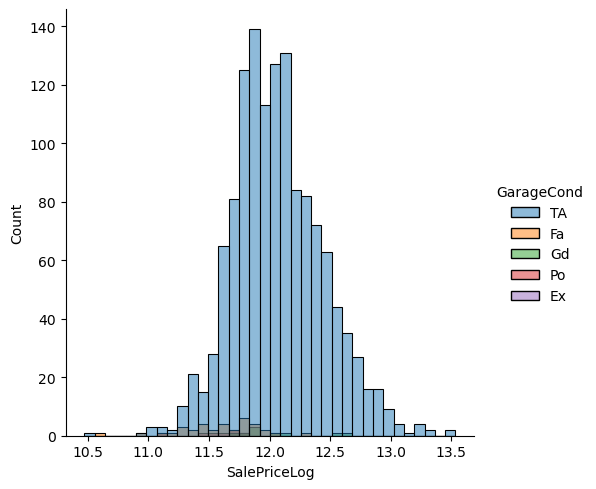

In [ ]:
sns.displot(df_Garage, x='SalePriceLog', hue='GarageCond')


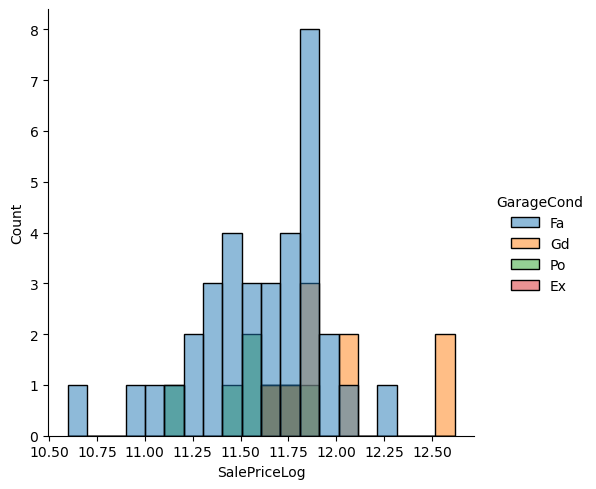

In [ ]:
df_Garage_not_avg = df_Garage[df_Garage['GarageCond'] != 'TA']
sns.displot(df_Garage_not_avg, x='SalePriceLog', hue='GarageCond', binwidth=0.1)

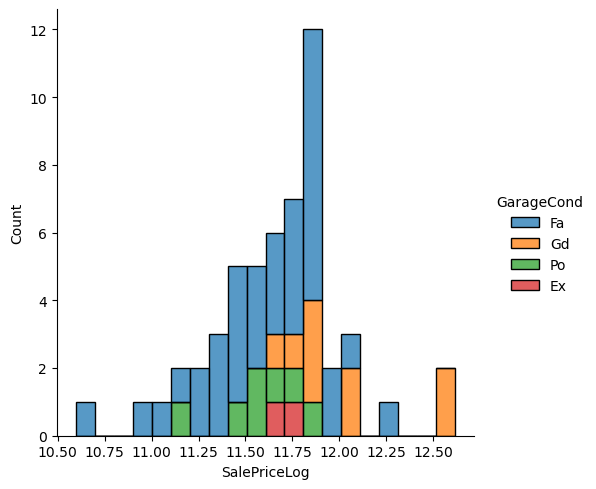

In [ ]:
sns.displot(df_Garage_not_avg, x='SalePriceLog', hue='GarageCond', multiple='stack', binwidth=0.1)

In [ ]:
df = df.drop('GarageCond', axis=1)

In [ ]:
df['GarageFinish'].value_counts()

GarageFinish
Unf    605
RFn    422
Fin    352
NA      81
Name: count, dtype: int64

In [ ]:
df['SaleType'].value_counts()

SaleType
WD       1267
New       122
COD        43
ConLD       9
ConLI       5
ConLw       5
CWD         4
Oth         3
Con         2
Name: count, dtype: int64

In [ ]:
df['SaleType'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 1460 entries, 0 to 1459
Series name: SaleType
Non-Null Count  Dtype 
--------------  ----- 
1460 non-null   object
dtypes: object(1)
memory usage: 11.5+ KB


In [ ]:
Label_to_Oth = ['New','COD','ConLD','ConLI','ConLw','Con']

for Label in Label_to_Oth:
    df.loc[df['SaleType'] == Label, ['SaleType']] = 'Oth'



In [ ]:
df.loc[df['SaleType'] == 'CWD', ['SaleType']] = 'WD'
df.iloc[253]

MSSubClass             80
MSZoning               RL
LotFrontage          85.0
LotArea              9350
Street               Pave
                   ...   
MiscVal                 0
SaleType               WD
SaleCondition      Normal
SalePrice          158000
SalePriceLog     11.97035
Name: 253, Length: 76, dtype: object

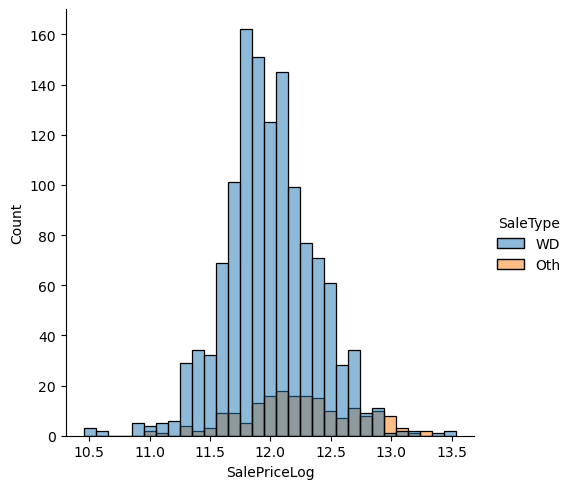

In [ ]:
sns.displot(df, x='SalePriceLog', hue='SaleType', binwidth=0.1)

<Axes: title={'center': 'SalePriceLog'}, xlabel='SaleType'>

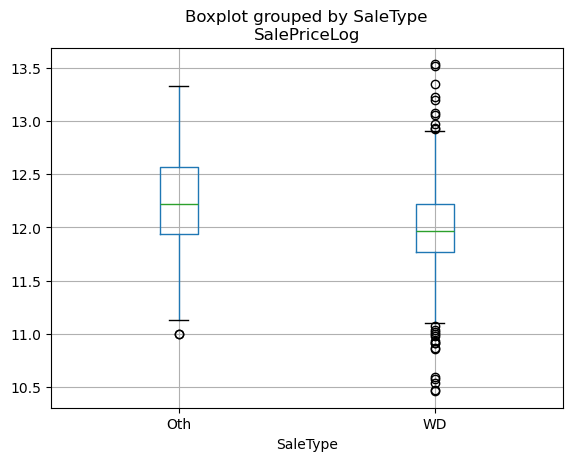

In [ ]:
df.boxplot(by='SaleType', column='SalePriceLog')

In [ ]:
df['GarageFinish'].value_counts()

GarageFinish
Unf    605
RFn    422
Fin    352
NA      81
Name: count, dtype: int64

In [ ]:
df['GarageType'].value_counts()

GarageType
Attchd     870
Detchd     387
BuiltIn     88
NA          81
Basment     19
CarPort      9
2Types       6
Name: count, dtype: int64

In [ ]:
Label_to_Attchd = ['BuiltIn', 'Basment', '2Types']

for Label in Label_to_Attchd:
    df.loc[df['GarageType'] == Label, ['GarageType']] = 'Attchd'

df.loc[df['GarageType'] == 'CarPort', ['GarageType']] = 'Detchd'


In [ ]:
df['SaleCondition'].value_counts()

SaleCondition
Normal     1198
Partial     125
Abnorml     101
Family       20
Alloca       12
AdjLand       4
Name: count, dtype: int64

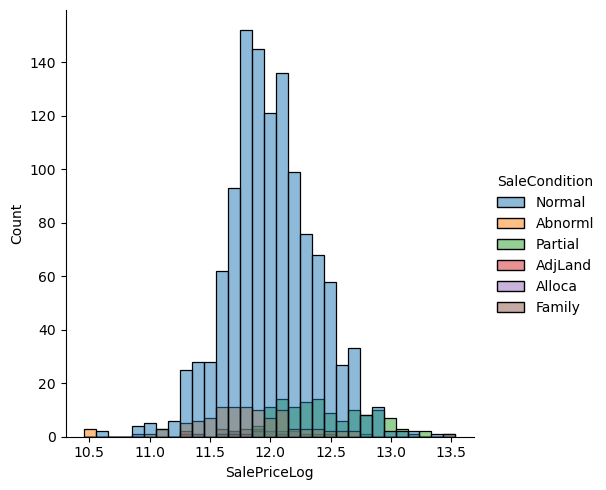

In [ ]:
sns.displot(df, x='SalePriceLog', hue='SaleCondition', binwidth=0.1)

In [ ]:
Label_to_Abnorml = ['Alloca','AdjLand','Family']

for Label in Label_to_Abnorml:
    df.loc[df['SaleCondition'] == Label, ['SaleCondition']] = 'Abnorml'

In [ ]:
df['MiscFeature'].value_counts()

MiscFeature
NA      1406
Shed      49
Gar2       2
Othr       2
TenC       1
Name: count, dtype: int64

In [ ]:
df = df.drop('MiscFeature', axis=1)

In [ ]:
df['Fence'].value_counts()

Fence
NA       1179
MnPrv     157
GdPrv      59
GdWo       54
MnWw       11
Name: count, dtype: int64

In [ ]:
Label_to_Fence = ['MnPrv','MnWw','GdWo','GdPrv']

for Label in Label_to_Fence:
    df.loc[df['Fence'] == Label, ['Fence']] = 'Fence'

In [ ]:
df['PoolQC'].value_counts()

PoolQC
NA    1453
Gd       3
Ex       2
Fa       2
Name: count, dtype: int64

In [ ]:
df = df.drop('PoolQC', axis=1)

In [ ]:
df['PavedDrive'].value_counts()

PavedDrive
Y    1340
N      90
P      30
Name: count, dtype: int64

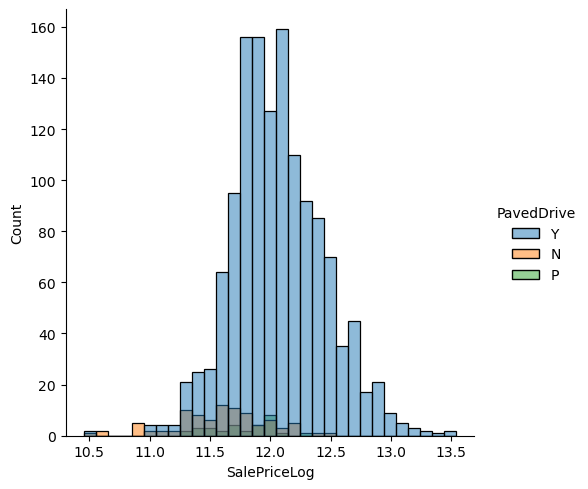

In [ ]:
sns.displot(df, x='SalePriceLog', hue='PavedDrive', binwidth=0.1)

In [ ]:
df.loc[df['PavedDrive'] == 'P', ['PavedDrive']] = 'N'

In [ ]:
df_obj = df.select_dtypes(include='object').columns
df_obj

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
       'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional',
       'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'PavedDrive',
       'Fence', 'SaleType', 'SaleCondition'],
      dtype='object')

c:\Users\Joseph\anaconda3\Lib\site-packages\pandas\plotting\_matplotlib\tools.py:233: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


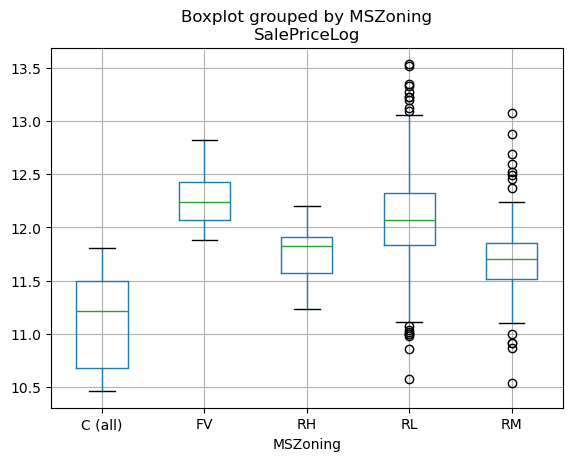

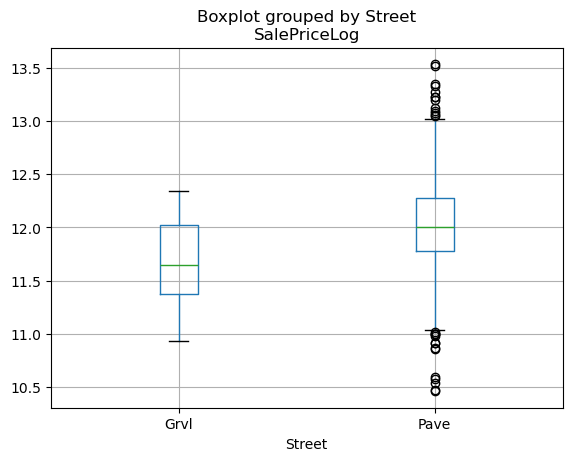

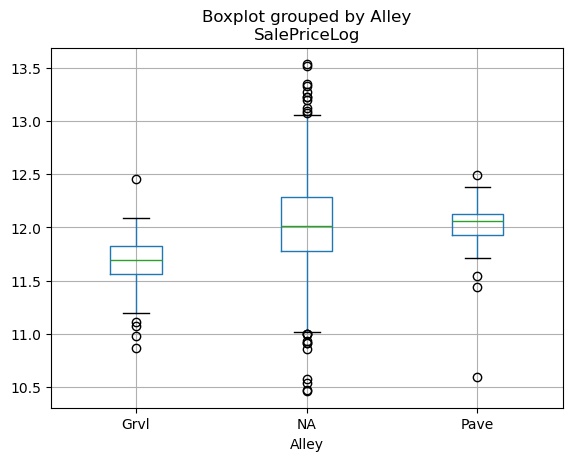

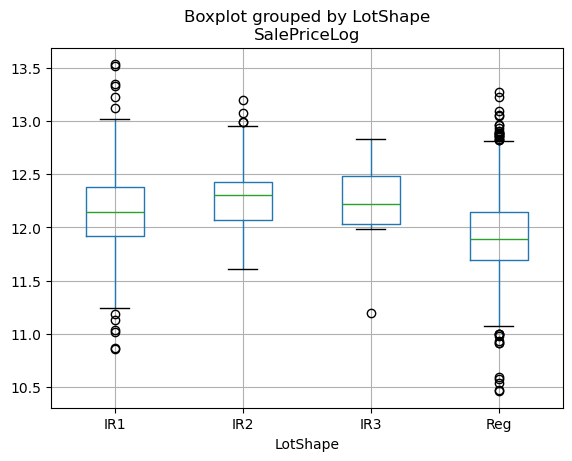

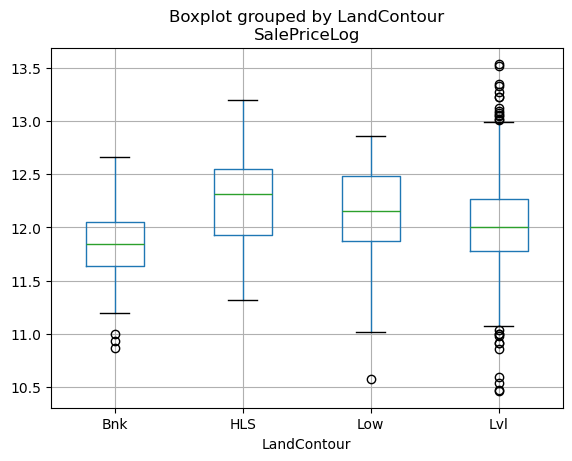

...

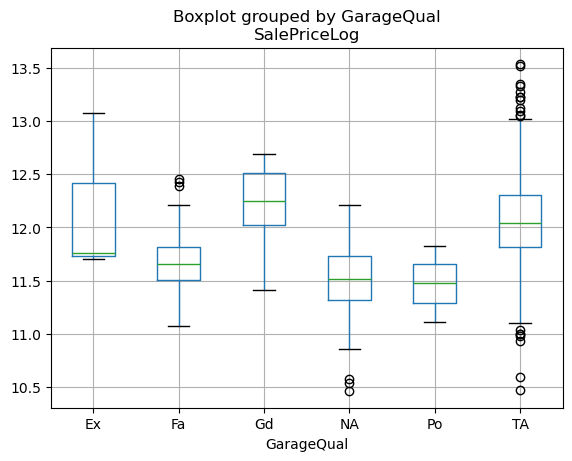

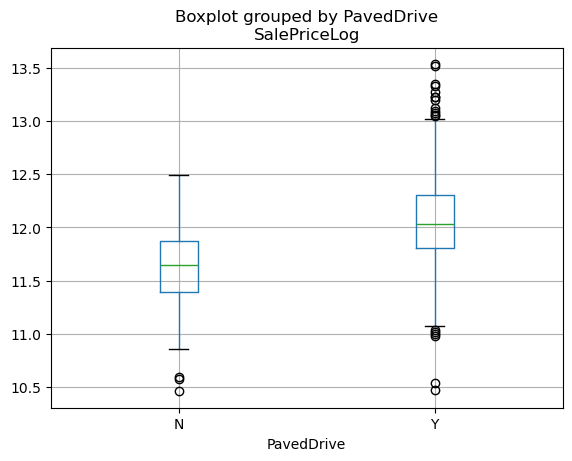

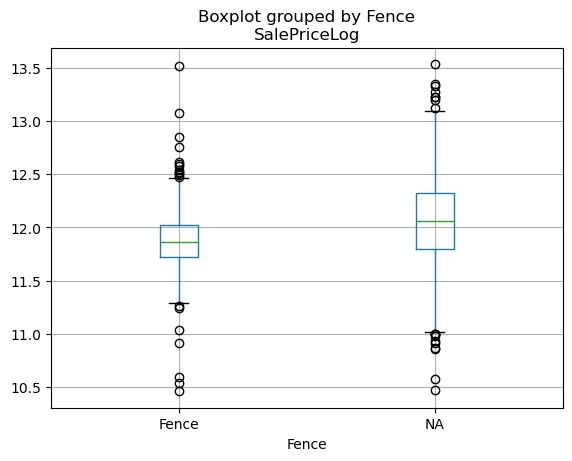

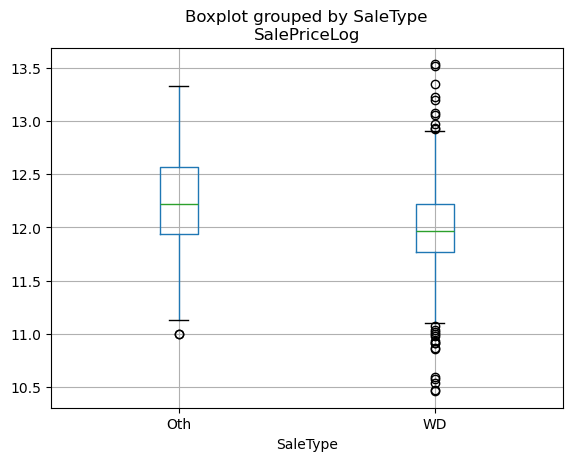

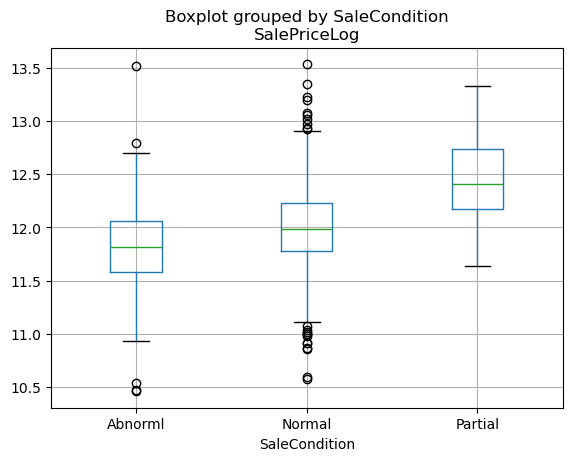

In [ ]:
for i in df_obj:
    df.boxplot(column='SalePriceLog', by=i)

In [ ]:
df['GarageQual'].value_counts()

GarageQual
TA    1311
NA      81
Fa      48
Gd      14
Ex       3
Po       3
Name: count, dtype: int64

In [ ]:
df = df.drop('GarageQual', axis=1)

In [ ]:
df['GarageFinish'].value_counts()

GarageFinish
Unf    605
RFn    422
Fin    352
NA      81
Name: count, dtype: int64

In [ ]:
df['FireplaceQu'].value_counts()

FireplaceQu
NA    690
Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: count, dtype: int64

In [ ]:

df.loc[df['FireplaceQu'] == 'Ex', ['FireplaceQu']] = 'Gd'

df.loc[df['FireplaceQu'] == 'Fa', ['FireplaceQu']] = 'Po'

In [ ]:
df['Functional'].value_counts()

Functional
Typ     1360
Min2      34
Min1      31
Mod       15
Maj1      14
Maj2       5
Sev        1
Name: count, dtype: int64

In [ ]:
Label_to_Atyp = ['Min1','Min2','Mod','Maj1','Maj2','Sev']

for label in Label_to_Atyp:
    df.loc[df['Functional'] == label, ['Functional']] = 'Atype'

In [ ]:
df['KitchenQual'].value_counts()

KitchenQual
TA    735
Gd    586
Ex    100
Fa     39
Name: count, dtype: int64

In [ ]:
df['Electrical'].value_counts()

Electrical
SBrkr    1335
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: count, dtype: int64

In [ ]:
Label_to_Fuse = ['FuseA','FuseF','FuseP','Mix']

for label in Label_to_Fuse:
    df.loc[df['Electrical'] == label, ['Electrical']] = 'Fuse'

In [ ]:
df['HeatingQC'].value_counts()

HeatingQC
Ex    741
TA    428
Gd    241
Fa     49
Po      1
Name: count, dtype: int64

In [ ]:
df.loc[df['HeatingQC'] == 'Po', ['HeatingQC']] = 'Fa'

In [ ]:
df['BsmtFinType2'].value_counts()

BsmtFinType2
Unf    1257
Rec      54
LwQ      46
NA       37
BLQ      33
ALQ      19
GLQ      14
Name: count, dtype: int64

In [ ]:
df['Exterior2nd'].value_counts()

Exterior2nd
VinylSd    504
MetalSd    214
HdBoard    207
Wd Sdng    197
Plywood    142
CmentBd     60
Wd Shng     38
Stucco      26
BrkFace     25
AsbShng     20
ImStucc     10
Brk Cmn      7
Stone        5
AsphShn      3
Other        1
CBlock       1
Name: count, dtype: int64

In [ ]:
df['Exterior1st'].value_counts()

Exterior1st
VinylSd    515
HdBoard    222
MetalSd    220
Wd Sdng    206
Plywood    108
CemntBd     61
BrkFace     50
WdShing     26
Stucco      25
AsbShng     20
BrkComm      2
Stone        2
AsphShn      1
ImStucc      1
CBlock       1
Name: count, dtype: int64

<Axes: title={'center': 'SalePriceLog'}, xlabel='Exterior2nd'>

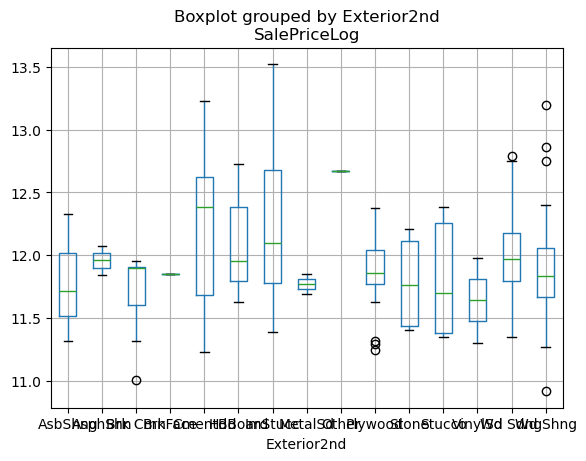

In [ ]:
df_diff_ext = df[df['Exterior2nd'] != df['Exterior1st']]
df_diff_ext.boxplot(column='SalePriceLog', by='Exterior2nd')

<Axes: title={'center': 'SalePriceLog'}, xlabel='Exterior1st'>

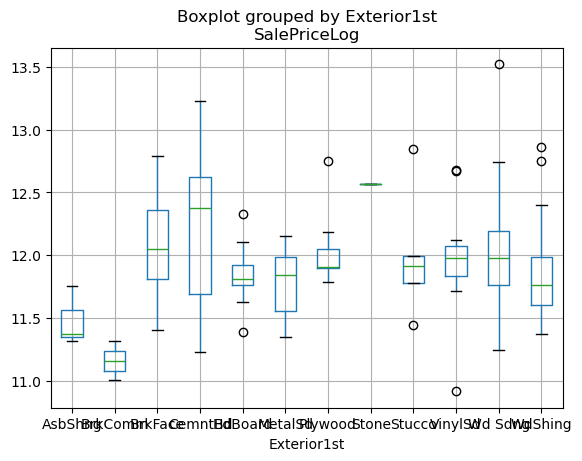

In [ ]:
df_diff_ext = df[df['Exterior2nd'] != df['Exterior1st']]
df_diff_ext.boxplot(column='SalePriceLog', by='Exterior1st')

In [ ]:
df_diff_ext[['Exterior1st','Exterior2nd']].value_counts()

Exterior1st  Exterior2nd
CemntBd      CmentBd        59
HdBoard      Plywood        23
WdShing      Wd Shng        17
BrkFace      Wd Sdng        12
Wd Sdng      Wd Shng         9
             Plywood         8
BrkFace      Plywood         6
Plywood      Brk Cmn         5
VinylSd      Wd Shng         5
WdShing      Plywood         5
Stucco       Wd Shng         3
Plywood      ImStucc         3
MetalSd      HdBoard         3
BrkFace      HdBoard         3
Wd Sdng      ImStucc         3
HdBoard      ImStucc         2
MetalSd      Wd Sdng         2
BrkComm      Brk Cmn         2
BrkFace      Stone           2
Plywood      HdBoard         2
Wd Sdng      HdBoard         2
             VinylSd         2
AsbShng      Plywood         2
VinylSd      Plywood         2
Plywood      Wd Sdng         2
WdShing      HdBoard         2
HdBoard      Wd Shng         1
MetalSd      Stucco          1
             AsphShn         1
HdBoard      Wd Sdng         1
             AsphShn         1
BrkFace      S

In [ ]:
df['Exterior1st'].unique()

array(['VinylSd', 'MetalSd', 'Wd Sdng', 'HdBoard', 'BrkFace', 'WdShing',
       'CemntBd', 'Plywood', 'AsbShng', 'Stucco', 'BrkComm', 'AsphShn',
       'Stone', 'ImStucc', 'CBlock'], dtype=object)

In [ ]:
df['Exterior2nd'].unique()

array(['VinylSd', 'MetalSd', 'Wd Shng', 'HdBoard', 'Plywood', 'Wd Sdng',
       'CmentBd', 'BrkFace', 'Stucco', 'AsbShng', 'Brk Cmn', 'ImStucc',
       'AsphShn', 'Stone', 'Other', 'CBlock'], dtype=object)

In [ ]:
df.loc[df['Exterior2nd'] == 'Wd Shng', ['Exterior2nd']] = 'WdShing'
df.loc[df['Exterior2nd'] == 'CmentBd', ['Exterior2nd']] = 'CemntBd'
df.loc[df['Exterior2nd'] == 'Brk Cmn', ['Exterior2nd']] = 'BrkComm'


In [ ]:
df = df.drop('Exterior1st', axis=1)

In [ ]:
df['ExteriorMat'] = df['Exterior2nd']
df = df.drop('Exterior2nd', axis=1)

In [ ]:
df['Heating'].value_counts()

Heating
GasA     1428
GasW       18
Grav        7
Wall        4
OthW        2
Floor       1
Name: count, dtype: int64

In [ ]:
df = df.drop('Heating', axis=1)

In [ ]:
df['BsmtFinType1'].value_counts()

BsmtFinType1
Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
NA      37
Name: count, dtype: int64

In [ ]:
df['BsmtFinType2'].value_counts()

BsmtFinType2
Unf    1257
Rec      54
LwQ      46
NA       37
BLQ      33
ALQ      19
GLQ      14
Name: count, dtype: int64

In [ ]:
df.loc[(df['BsmtFinType1'] != 'Unf')]['BsmtUnfSF']

0       150
1       284
2       434
3       540
4       490
       ... 
1454    811
1456    589
1457    877
1458      0
1459    136
Name: BsmtUnfSF, Length: 1030, dtype: int64

In [ ]:
df['AreaSum'] = df['BsmtUnfSF'] + df['BsmtFinSF2'] + df['BsmtFinSF1']

In [ ]:
df.loc[(df['TotalBsmtSF'] == df['AreaSum'])]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,...,ScreenPorch,PoolArea,Fence,MiscVal,SaleType,SaleCondition,SalePrice,SalePriceLog,ExteriorMat,AreaSum
0,60,RL,65.0,8450,Pave,NA,Reg,Lvl,Inside,Gtl,...,0,0,NA,0,WD,Normal,208500,12.247694,VinylSd,856
1,20,RL,80.0,9600,Pave,NA,Reg,Lvl,FR2,Gtl,...,0,0,NA,0,WD,Normal,181500,12.109011,MetalSd,1262
2,60,RL,68.0,11250,Pave,NA,IR1,Lvl,Inside,Gtl,...,0,0,NA,0,WD,Normal,223500,12.317167,VinylSd,920
3,70,RL,60.0,9550,Pave,NA,IR1,Lvl,Corner,Gtl,...,0,0,NA,0,WD,Abnorml,140000,11.849398,WdShing,756
4,60,RL,84.0,14260,Pave,NA,IR1,Lvl,FR2,Gtl,...,0,0,NA,0,WD,Normal,250000,12.429216,VinylSd,1145
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,NA,Reg,Lvl,Inside,Gtl,...,0,0,NA,0,WD,Normal,175000,12.072541,VinylSd,953
1456,20,RL,85.0,13175,Pave,NA,Reg,Lvl,Inside,Gtl,...,0,0,Fence,0,WD,Normal,210000,12.254863,Plywood,1542
1457,70,RL,66.0,9042,Pave,NA,Reg,Lvl,Inside,Gtl,...,0,0,Fence,2500,WD,Normal,266500,12.493130,CemntBd,1152
1458,20,RL,68.0,9717,Pave,NA,Reg,Lvl,Inside,Gtl,...,0,0,NA,0,WD,Normal,142125,11.864462,MetalSd,1078


In [ ]:
df.loc[(df['BsmtFinType2'] == 'Unf') & (df['BsmtFinSF2'] == 0), ['BsmtFinType2']] = 'NA'

In [ ]:
df = df.drop(['AreaSum', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF'], axis=1)

In [ ]:
df.loc[(df['BsmtFinType2'] == 'NA') & (df['TotalBsmtSF'] > 0), ['BsmtFinType2']] = 'Unf'

In [ ]:
df['RoofMatl'].value_counts()

RoofMatl
CompShg    1434
Tar&Grv      11
WdShngl       6
WdShake       5
Metal         1
Membran       1
Roll          1
ClyTile       1
Name: count, dtype: int64

In [ ]:
df['RoofStyle'].value_counts()

RoofStyle
Gable      1141
Hip         286
Flat         13
Gambrel      11
Mansard       7
Shed          2
Name: count, dtype: int64

In [ ]:
Label_to_Oth = ['Flat', 'Gambrel', 'Mansard', 'Shed']

for label in Label_to_Oth:
    df.loc[df['RoofStyle'] == label, ['RoofStyle']] = 'Oth'

In [ ]:
df = df.drop('RoofMatl', axis=1)

In [ ]:
df['Foundation'].value_counts()

Foundation
PConc     647
CBlock    634
BrkTil    146
Slab       24
Stone       6
Wood        3
Name: count, dtype: int64

In [ ]:
Label_to_Oth = ['Slab', 'Stone', 'Wood']

for label in Label_to_Oth:
    df.loc[df['Foundation'] == label, ['Foundation']] = 'Oth'

In [ ]:
df['ExterCond'].value_counts()

ExterCond
TA    1282
Gd     146
Fa      28
Ex       3
Po       1
Name: count, dtype: int64

In [ ]:
df.loc[df['ExterCond'] == 'Ex', ['ExterCond']] = 'Gd'
df.loc[df['ExterCond'] == 'Po', ['ExterCond']] = 'Fa'

<Axes: title={'center': 'SalePriceLog'}, xlabel='ExterCond'>

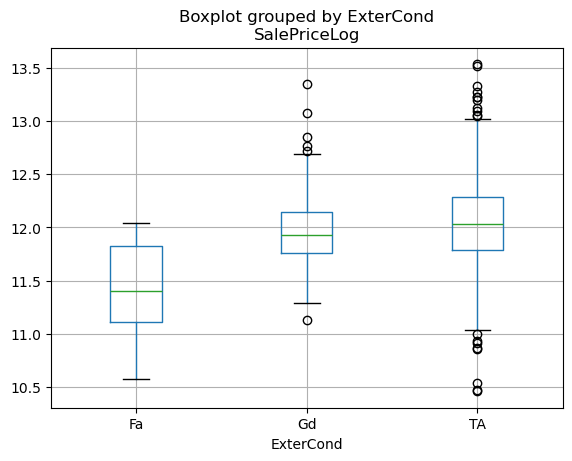

In [ ]:
df.boxplot(column='SalePriceLog', by='ExterCond')

In [ ]:
df.groupby('ExterCond')['SalePriceLog'].mean()

ExterCond
Fa    11.447917
Gd    11.972476
TA    12.043078
Name: SalePriceLog, dtype: float64

In [ ]:
df.loc[df['ExterCond'] == 'Gd', ['ExterCond']] = 'TA'

<Axes: title={'center': 'SalePriceLog'}, xlabel='ExterCond'>

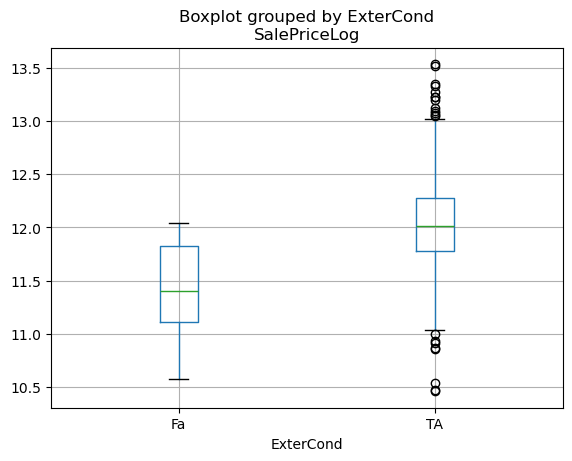

In [ ]:
df.boxplot(column='SalePriceLog', by='ExterCond')

In [ ]:
df.loc[df['ExterCond'] == 'TA', ['ExterCond']] = 'Gd'


c:\Users\Joseph\anaconda3\Lib\site-packages\pandas\plotting\_matplotlib\tools.py:233: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


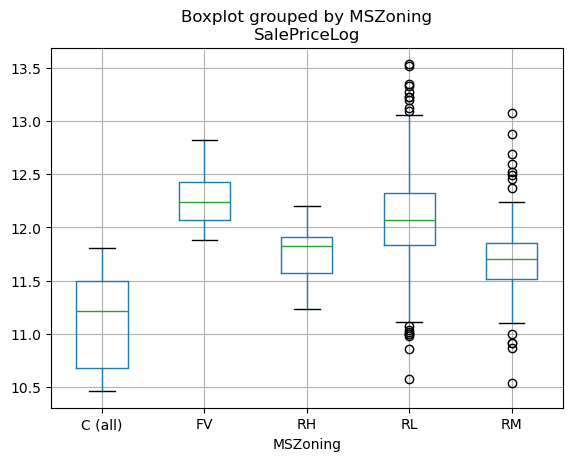

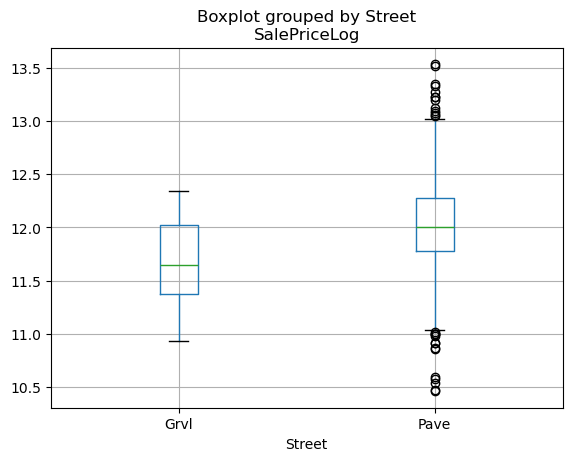

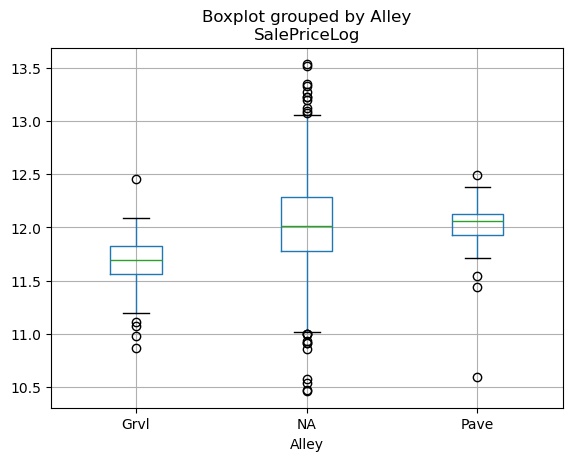

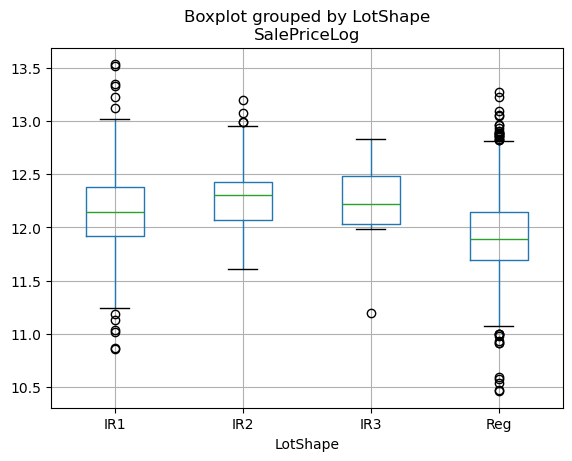

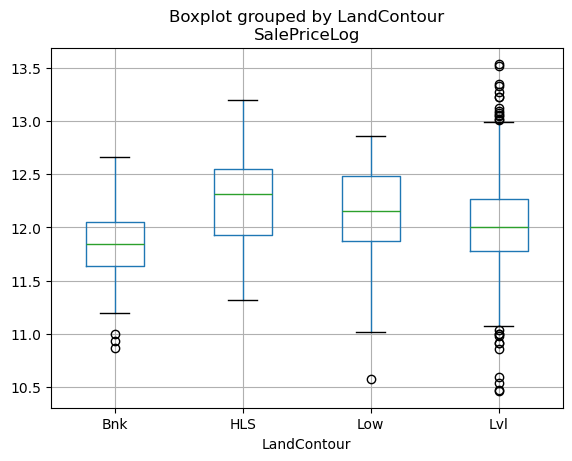

...

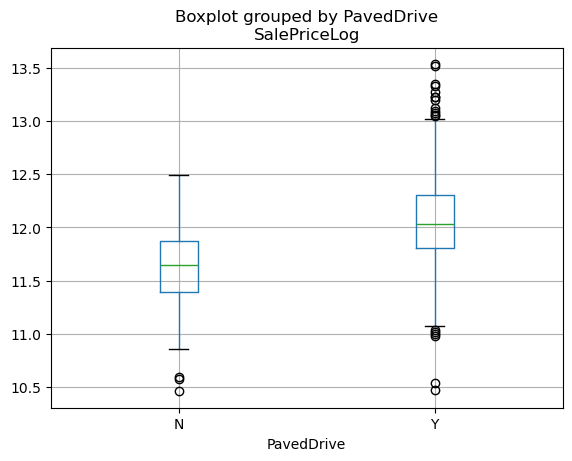

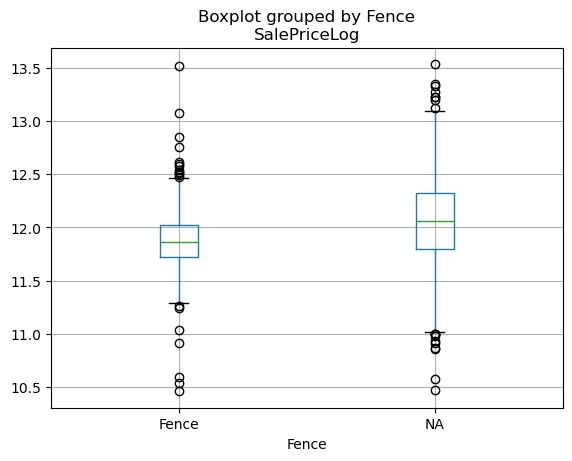

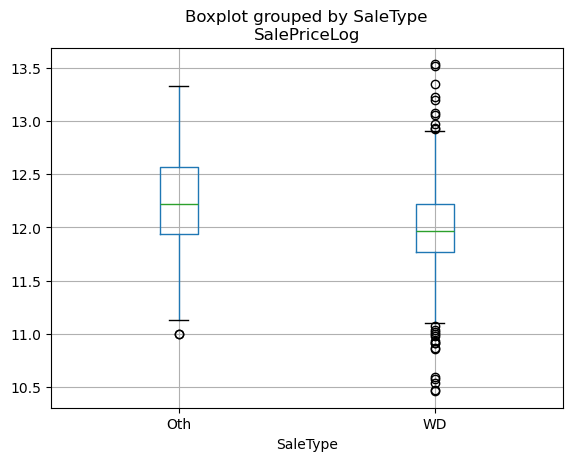

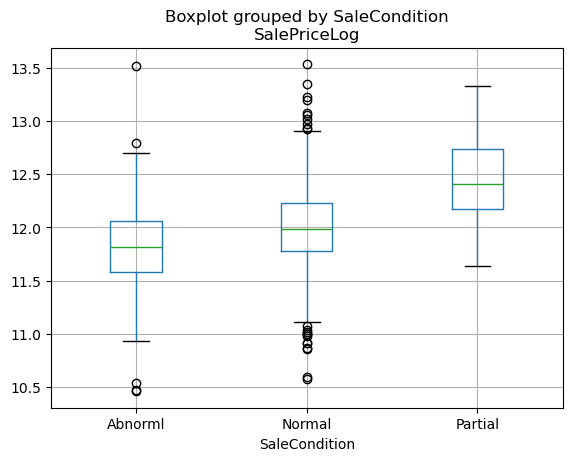

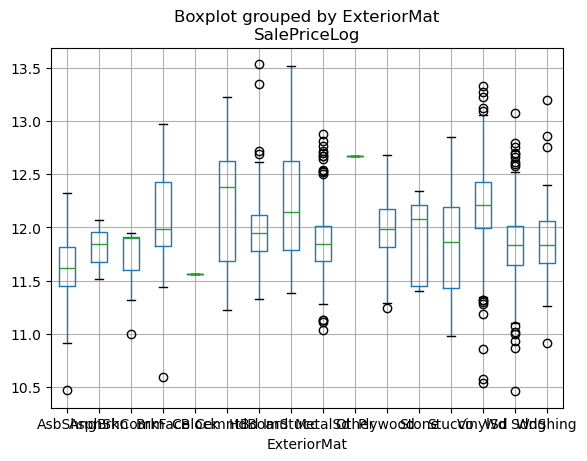

In [ ]:
df_obj = df.select_dtypes(include='object').columns

for i in df_obj:
    df.boxplot(column='SalePriceLog', by=i)

In [ ]:
df['RoofStyle'].value_counts()

RoofStyle
Gable    1141
Hip       286
Oth        33
Name: count, dtype: int64

In [ ]:
Label_to_Oth = ['Flat', 'Gambrel', 'Mansard', 'Shed']

for label in Label_to_Oth:
    df.loc[df['RoofStyle'] == label, ['RoofStyle']] == 'Oth'

In [ ]:
df['HouseStyle'].value_counts()

HouseStyle
1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: count, dtype: int64

In [ ]:
df['HouseFin'] = df.loc[(df['HouseStyle'] == '1.5Unf') | (df['HouseStyle'] == '2.5Unf') | (df['HouseStyle'] == '2.5Fin') | (df['HouseStyle'] == '1.5Fin'), ['HouseStyle']]
df['HouseFin'].iloc[5]

'1.5Fin'

In [ ]:
df.loc[(df['HouseStyle'] == '1.5Unf') | (df['HouseStyle'] == '2.5Unf') | (df['HouseStyle'] == '2.5Fin') | (df['HouseStyle'] == '1.5Fin'), ['HouseStyle']]

,HouseStyle
5,1.5Fin
8,1.5Fin
9,1.5Unf
15,1.5Unf
21,1.5Unf
...,...
1411,1.5Fin
1414,1.5Fin
1427,1.5Fin
1440,2.5Fin


In [ ]:
df.loc[(df['HouseStyle'] == '1.5Unf') | (df['HouseStyle'] == '2.5Unf'), ['HouseFin']] = 'Unfinished'
df.loc[(df['HouseStyle'] == '2.5Fin') | (df['HouseStyle'] == '1.5Fin'), ['HouseFin']] = 'Finished'
df['HouseFin'] = df['HouseFin'].fillna('Finished')

In [ ]:
df.loc[(df['HouseStyle'] == '1.5Fin') | (df['HouseStyle'] == '1.5Unf'), ['HouseStyle']] = '1.5Story'
df.loc[(df['HouseStyle'] == '2.5Fin') | (df['HouseStyle'] == '2.5Unf'), ['HouseStyle']] = '2.5Story'


In [ ]:
df.loc[(df['HouseStyle'] == '1Story'), ['HouseStyle']] = '1.0Story'
df.loc[(df['HouseStyle'] == '2Story'), ['HouseStyle']] = '2.0Story'

<Axes: title={'center': 'SalePriceLog'}, xlabel='HouseStyle'>

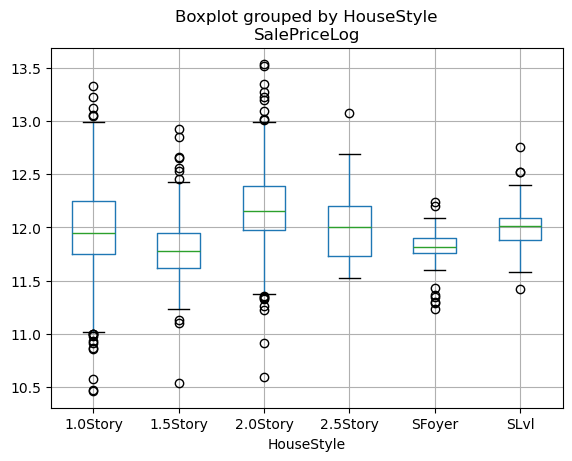

In [ ]:
df.boxplot(column='SalePriceLog', by='HouseStyle')

In [ ]:
df['BldgType'].value_counts()

BldgType
1Fam      1220
TwnhsE     114
Duplex      52
Twnhs       43
2fmCon      31
Name: count, dtype: int64

In [ ]:
df.loc[(df['BldgType'] == 'TwnhsE') | (df['BldgType'] == 'Twnhs'), ['BldgType']] = 'Twnhs'
df.loc[(df['BldgType'] == 'Duplex') | (df['BldgType'] == '2fmCon'), ['BldgType']] = 'Oth'

In [ ]:
df['Condition2'].value_counts()

Condition2
Norm      1445
Feedr        6
Artery       2
RRNn         2
PosN         2
PosA         1
RRAn         1
RRAe         1
Name: count, dtype: int64

In [ ]:
df = df.drop('Condition2', axis=1)

In [ ]:
df['Condition1'].value_counts()

Condition1
Norm      1260
Feedr       81
Artery      48
RRAn        26
PosN        19
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: count, dtype: int64

In [ ]:
df.loc[(df['Condition1'] == 'PosN') | (df['Condition1'] == 'PosA'), ['Condition1']] = 'Pos'
df.loc[(df['Condition1'] == 'RRAe') | (df['Condition1'] == 'RRNe'), ['Condition1']] = 'RREw'
df.loc[(df['Condition1'] == 'RRNn') | (df['Condition1'] == 'RRAn'), ['Condition1']] = 'RRNs'

<Axes: title={'center': 'SalePriceLog'}, xlabel='Condition1'>

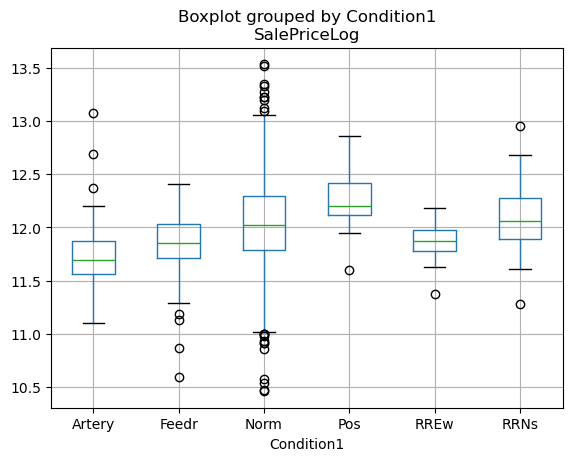

In [ ]:
df.boxplot(column='SalePriceLog', by='Condition1')

In [ ]:
df.loc[(df['Condition1'] == 'RRNs') | (df['Condition1'] == 'RREw'), ['Condition1']] = 'NRR'

In [ ]:
df['BsmtExposure'].value_counts()

BsmtExposure
No    953
Av    221
Gd    134
Mn    114
NA     37
Na      1
Name: count, dtype: int64

In [ ]:
df.loc[(df['BsmtExposure'] == 'Na') | (df['BsmtExposure'] == 'NA'), ['BsmtExposure']] = 'No'

In [ ]:
df['Neighborhood'].value_counts()

Neighborhood
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
SWISU       25
StoneBr     25
Blmngtn     17
MeadowV     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: count, dtype: int64

In [ ]:
df['LandSlope'].value_counts()

LandSlope
Gtl    1382
Mod      65
Sev      13
Name: count, dtype: int64

In [ ]:
df = df.drop('LandSlope', axis=1)

In [ ]:
df['LotConfig'].value_counts()

LotConfig
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: count, dtype: int64

In [ ]:
df['LandContour'].value_counts()

LandContour
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: count, dtype: int64

In [ ]:
Label_to_Uneven = ['Bnk','HLS','Low']

for label in Label_to_Uneven:
    df.loc[df['LandContour'] == label, 'LandContour'] = 'Uneven'

<Axes: title={'center': 'SalePriceLog'}, xlabel='LandContour'>

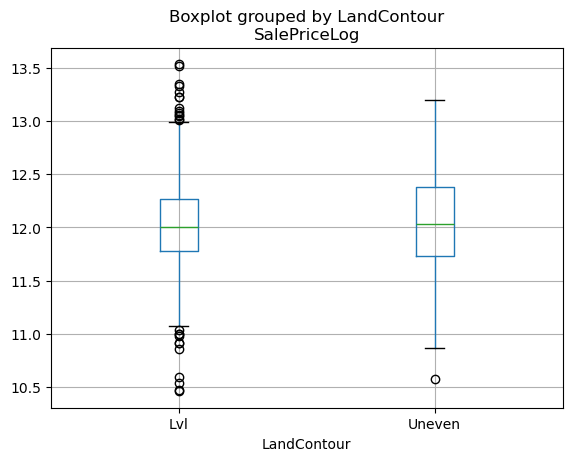

In [ ]:
df.boxplot(column='SalePriceLog', by='LandContour')

In [ ]:
df = df.drop('LandContour', axis=1)

In [ ]:
df['LotShape'].value_counts()

LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: count, dtype: int64

In [ ]:
Label_to_IR = ['IR1','IR2','IR3']

for label in Label_to_IR:
    df.loc[df['LotShape'] == label,'LotShape'] = 'IR'

In [ ]:
df['Alley'].value_counts()

Alley
NA      1369
Grvl      50
Pave      41
Name: count, dtype: int64

In [ ]:
df['Street'].value_counts()

Street
Pave    1454
Grvl       6
Name: count, dtype: int64

In [ ]:
df = df.drop('Street', axis=1)

In [ ]:
df['MSZoning'].value_counts()

MSZoning
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: count, dtype: int64

c:\Users\Joseph\anaconda3\Lib\site-packages\pandas\plotting\_matplotlib\tools.py:233: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


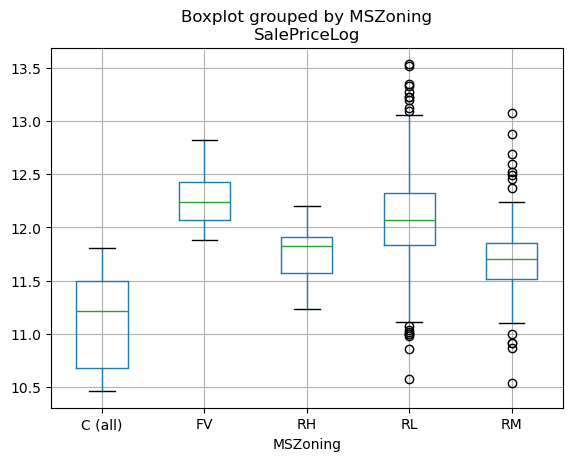

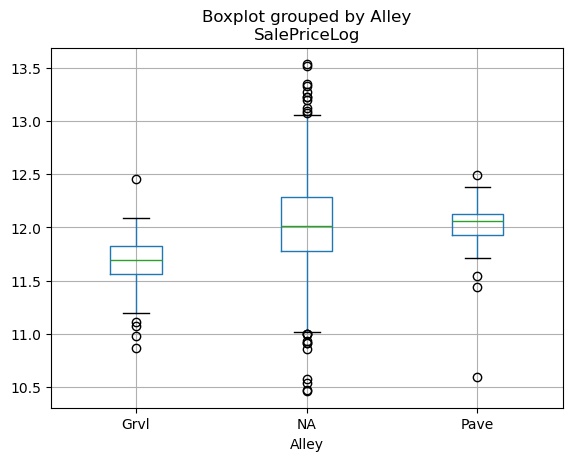

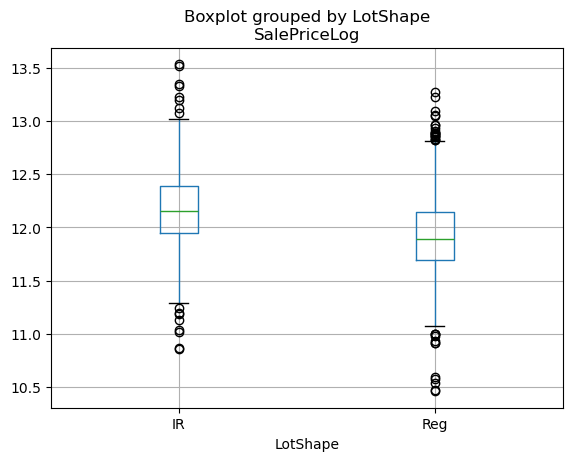

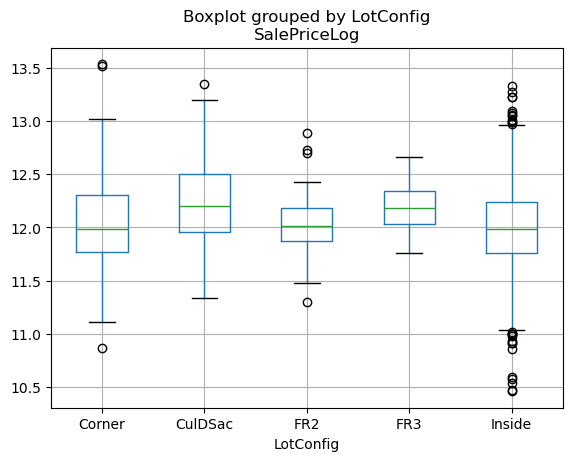

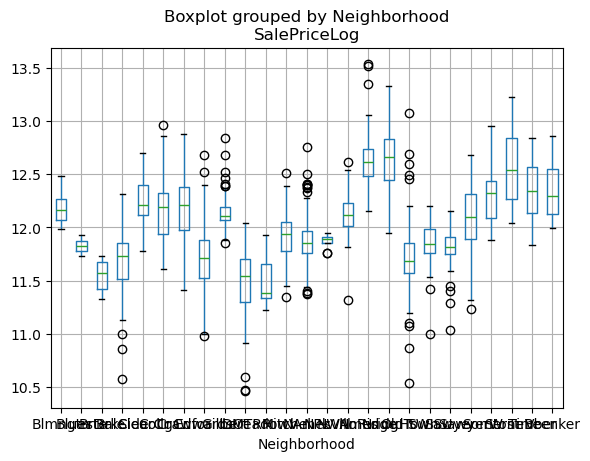

...

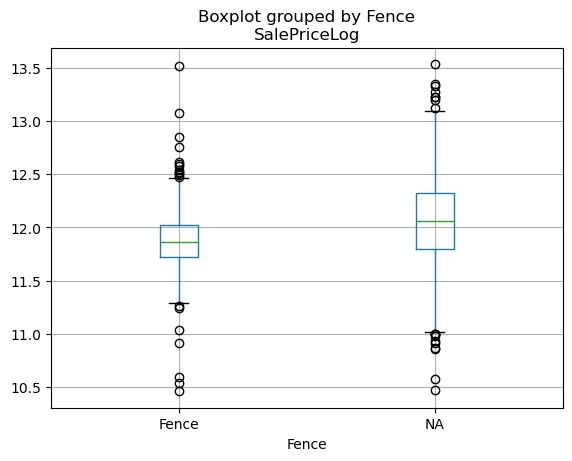

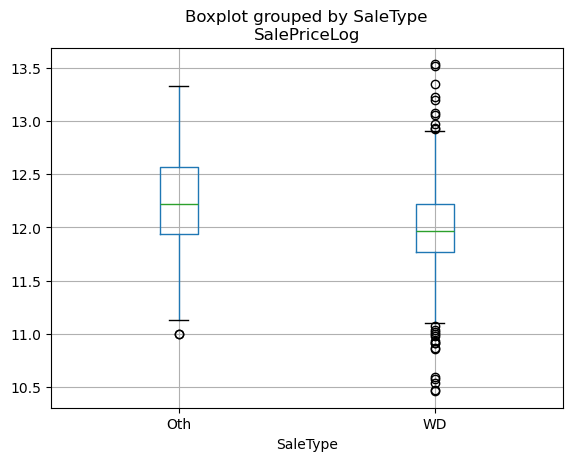

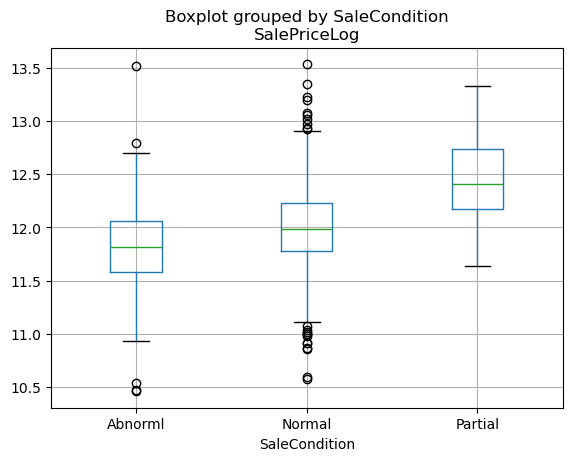

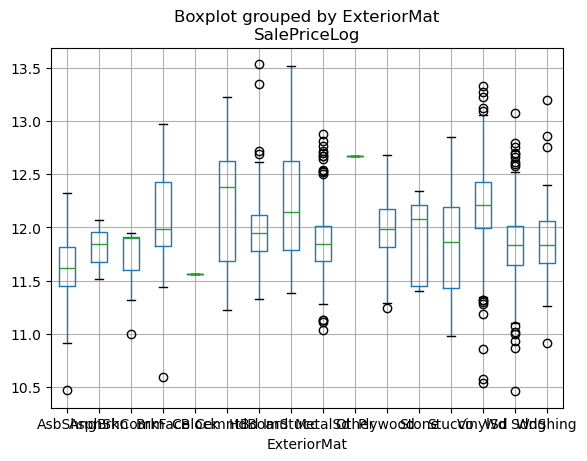

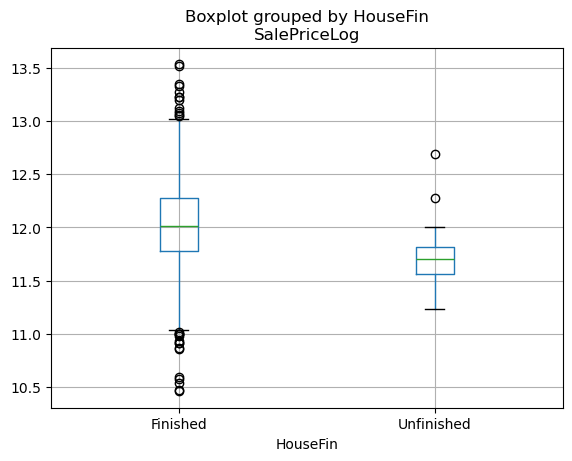

In [ ]:
df_obj = df.select_dtypes(include='object').columns

for i in df_obj:
    df.boxplot(column='SalePriceLog', by=i)

<Axes: title={'center': 'SalePriceLog'}, xlabel='ExteriorMat'>

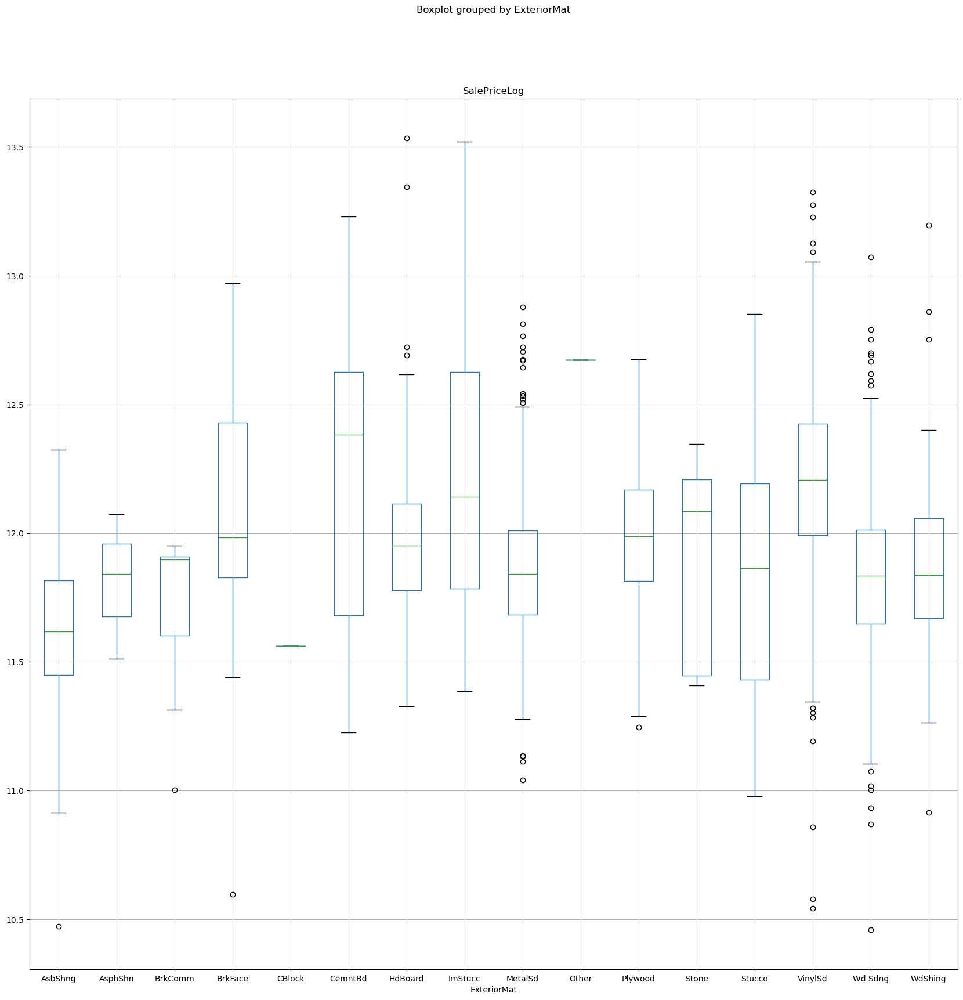

In [ ]:
df.boxplot(column='SalePriceLog', by='ExteriorMat', figsize=(20, 20))

In [ ]:
df['ExteriorMat'].value_counts()

ExteriorMat
VinylSd    504
MetalSd    214
HdBoard    207
Wd Sdng    197
Plywood    142
CemntBd     60
WdShing     38
Stucco      26
BrkFace     25
AsbShng     20
ImStucc     10
BrkComm      7
Stone        5
AsphShn      3
Other        1
CBlock       1
Name: count, dtype: int64

In [ ]:
df['ExteriorStyle'] = df['ExteriorMat']

In [ ]:
Label_to_Siding = ['VinylSd','MetalSd','Wd Sdng']
Label_to_Shingle = ['WdShing','AsbShng','AsphShn']
Label_to_Other = ['HdBoard','Plywood','CemntBd','Stucco','BrkFace','ImStucc','BrkComm','Stone','CBlock']

for label in Label_to_Siding:
    df.loc[df['ExteriorStyle'] == label,'ExteriorStyle'] = 'Siding'

for label in Label_to_Shingle:
    df.loc[df['ExteriorStyle'] == label,'ExteriorStyle'] = 'Shingle'

for label in Label_to_Other:
    df.loc[df['ExteriorStyle'] == label,'ExteriorStyle'] = 'Other'

<Axes: title={'center': 'SalePriceLog'}, xlabel='ExteriorStyle'>

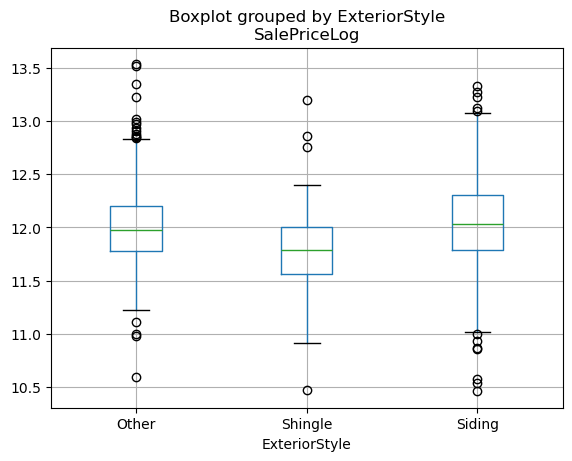

In [ ]:
df.boxplot(column='SalePriceLog', by='ExteriorStyle')

In [ ]:
df.loc[df['ExteriorMat'] == 'WdShing','ExteriorMat'] = 'Wood'
df.loc[df['ExteriorMat'] == 'Wd Sdng','ExteriorMat'] = 'Wood'
df.loc[df['ExteriorMat'] == 'BrkFace','ExteriorMat'] = 'Brick'
df.loc[df['ExteriorMat'] == 'BrkComm','ExteriorMat'] = 'Brick'
df.loc[df['ExteriorMat'] == 'ImStucc','ExteriorMat'] = 'Stucco'

In [ ]:
Label_to_Other = ['CBlock','AsphShn','Stone','AsbShng','Brick','CemntBd']

for label in Label_to_Other:
    df.loc[df['ExteriorMat'] == label,'ExteriorMat'] = 'Other'

<Axes: title={'center': 'SalePriceLog'}, xlabel='ExteriorMat'>

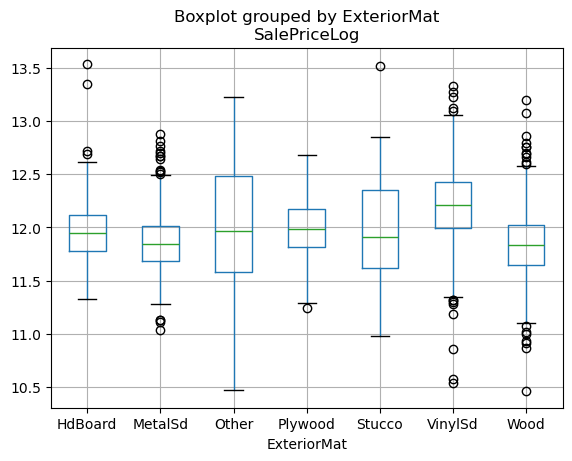

In [ ]:
df.boxplot(column='SalePriceLog', by='ExteriorMat')

array([[<Axes: title={'center': 'SalePriceLog'}>]], dtype=object)

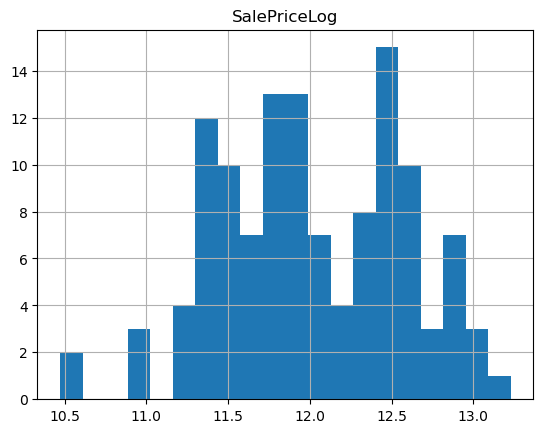

In [ ]:
df[df['ExteriorMat'] == 'Other'].hist(column='SalePriceLog', bins=20,)

<Axes: xlabel='SalePriceLog', ylabel='Density'>

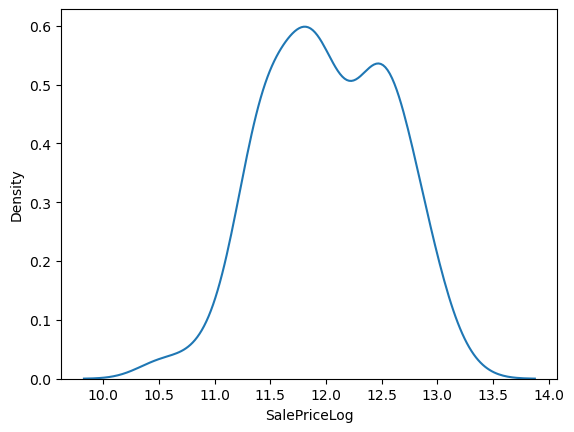

In [ ]:
sns.kdeplot(data=df[df['ExteriorMat'] == 'Other'], x="SalePriceLog", bw_adjust=1)

<Axes: xlabel='SalePriceLog', ylabel='Density'>

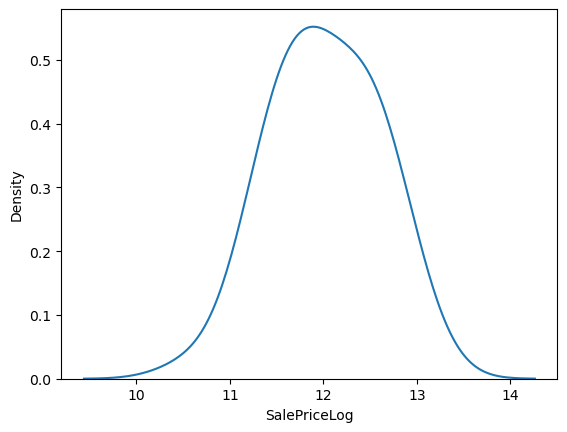

In [ ]:
sns.kdeplot(data=df[df['ExteriorMat'] == 'Other'], x="SalePriceLog", bw_adjust=1.6)

<Axes: xlabel='SalePriceLog', ylabel='Density'>

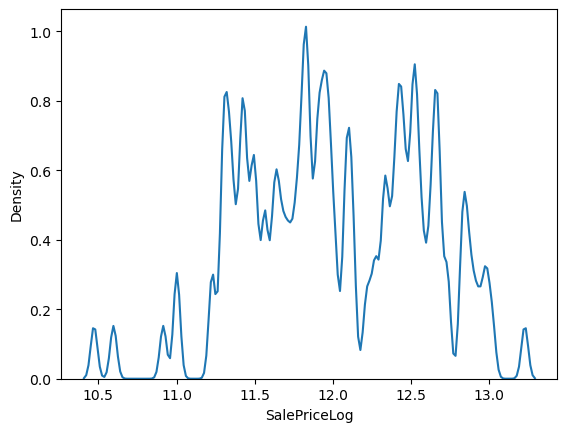

In [ ]:
sns.kdeplot(data=df[df['ExteriorMat'] == 'Other'], x="SalePriceLog", bw_adjust=0.1)

In [1]:
for i in df.columns:        
    x = df[i].isna().sum()
    if x > 0:
        print(f'{i}: {x}')

NameError: name 'df' is not defined

In [ ]:
df_cleaned = df
df_cleaned

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LotConfig,Neighborhood,Condition1,BldgType,...,PoolArea,Fence,MiscVal,SaleType,SaleCondition,SalePrice,SalePriceLog,ExteriorMat,HouseFin,ExteriorStyle
0,60,RL,65.0,8450,NA,Reg,Inside,CollgCr,Norm,1Fam,...,0,NA,0,WD,Normal,208500,12.247694,VinylSd,Finished,Siding
1,20,RL,80.0,9600,NA,Reg,FR2,Veenker,Feedr,1Fam,...,0,NA,0,WD,Normal,181500,12.109011,MetalSd,Finished,Siding
2,60,RL,68.0,11250,NA,IR,Inside,CollgCr,Norm,1Fam,...,0,NA,0,WD,Normal,223500,12.317167,VinylSd,Finished,Siding
3,70,RL,60.0,9550,NA,IR,Corner,Crawfor,Norm,1Fam,...,0,NA,0,WD,Abnorml,140000,11.849398,Wood,Finished,Shingle
4,60,RL,84.0,14260,NA,IR,FR2,NoRidge,Norm,1Fam,...,0,NA,0,WD,Normal,250000,12.429216,VinylSd,Finished,Siding
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,NA,Reg,Inside,Gilbert,Norm,1Fam,...,0,NA,0,WD,Normal,175000,12.072541,VinylSd,Finished,Siding
1456,20,RL,85.0,13175,NA,Reg,Inside,NWAmes,Norm,1Fam,...,0,Fence,0,WD,Normal,210000,12.254863,Plywood,Finished,Other
1457,70,RL,66.0,9042,NA,Reg,Inside,Crawfor,Norm,1Fam,...,0,Fence,2500,WD,Normal,266500,12.493130,Other,Finished,Other
1458,20,RL,68.0,9717,NA,Reg,Inside,NAmes,Norm,1Fam,...,0,NA,0,WD,Normal,142125,11.864462,MetalSd,Finished,Siding


In [ ]:
df_cleaned.to_csv('train_cleaned.csv', index=False)

## Summary statistics

In [ ]:
## Understanding distribution of target
df['SalePrice'].plot(kind='hist')

In [ ]:
## Understanding relation ship of best feature with target column
df.plot(kind='scatter', y='OverallQual', x='SalePriceLog')
plt.title('Relationship of OverallQual against SalePrice')

In [ ]:
## Understanding relation between features
sns.heatmap(df_corr, cmap='RdYlGn')
plt.show()

## Modelling

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split

In [ ]:
df = df.drop('SalePrice', axis=1)

In [ ]:
y = df['SalePriceLog']
X = df.drop('SalePriceLog', axis=1)
X = pd.get_dummies(X, drop_first=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=200)

In [ ]:
from sklearn.ensemble import RandomForestRegressor

RFR = RandomForestRegressor()
RFR.fit(X_train, y_train)

,n_estimators,100
,criterion,'squared_error'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,1.0
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [ ]:
y_pred = RFR.predict(X_test)
y_pred

array([11.83106896, 11.57226297, 11.67788365, 11.93497205, 12.18937383,
       12.07486112, 12.11703452, 12.71812402, 12.43840817, 11.9428902 ,
       11.91563365, 12.10344909, 11.88542977, 12.69663176, 11.42660996,
       11.83425538, 12.16906712, 12.98179011, 12.14369144, 12.02202123,
       11.75692144, 12.12497553, 11.50475368, 11.80519512, 12.71119865,
       12.91971476, 11.97781017, 11.69397614, 12.58765462, 11.88192172,
       11.87048702, 12.67740951, 12.39911876, 11.73819711, 12.04921037,
       12.35925786, 11.96250916, 11.5989726 , 11.67727835, 11.67553876,
       12.20743595, 11.63700704, 12.6884168 , 12.6313121 , 12.276476  ,
       11.73077099, 11.91276557, 12.06674213, 11.52181034, 11.94123431,
       11.93710445, 12.03731598, 11.89612272, 12.78422027, 11.83980323,
       11.74625717, 12.08609654, 12.18668745, 11.48906571, 11.617392  ,
       11.68930089, 12.60792813, 13.08253174, 12.72726715, 12.27931051,
       12.02046117, 12.06272933, 11.1575058 , 12.46667652, 12.62

In [ ]:
RFR_MSE = mean_squared_error(y_test, y_pred)
print(RFR_MSE)
RFR_RMSE = root_mean_squared_error(y_test, y_pred)
print(RFR_RMSE)
RFR_MAE = mean_absolute_error(y_test, y_pred)
print(RFR_MAE)
RFR_r2 = r2_score(y_test, y_pred)
print(RFR_r2)

0.02341874841105336
0.15303185423647378
0.0993814990107149
0.8601125443337327


In [ ]:
RFR.feature_importances_

array([3.40419839e-03, 6.84426576e-03, 1.85967416e-02, 5.23436717e-01,
       8.63853998e-03, 1.48045024e-02, 1.25300470e-02, 4.29668793e-03,
       6.29767187e-02, 2.23833638e-02, 5.91303981e-03, 2.00718558e-04,
       1.33007148e-01, 3.16023485e-03, 4.60823850e-04, 1.22972969e-03,
       9.45513547e-04, 2.30857848e-03, 2.52758935e-03, 2.24679780e-03,
       2.36804116e-03, 3.70907681e-02, 4.16163169e-02, 4.10070047e-03,
       4.77882923e-03, 2.49316815e-03, 3.13708960e-04, 7.00491714e-04,
       8.63296144e-05, 2.58309274e-04, 1.01702323e-04, 3.44839600e-05,
       1.12990189e-03, 4.68134952e-03, 5.61989489e-04, 1.77615077e-04,
       1.58403039e-03, 2.43039502e-04, 9.81720576e-05, 1.25681185e-05,
       5.36218806e-04, 1.18164214e-06, 1.92091054e-05, 2.05913657e-04,
       1.45255956e-04, 3.33992580e-04, 7.04328102e-04, 9.70704377e-04,
       1.72417718e-04, 3.19818046e-04, 4.63492886e-05, 8.86841085e-05,
       1.12584624e-03, 1.56904924e-05, 4.86636176e-04, 1.55658278e-04,
      

In [ ]:
RFR.feature_names_in_

array(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM',
       'Alley_NA', 'Alley_Pave', 'LotShape_Reg', 'LotConfig_CulDSac',
       'LotConfig_FR2', 'LotConfig_FR3', 'LotConfig_Inside',
       'Neighborhood_Blueste', 'Neighborhood_BrDale',
       'Neighborhood_BrkSide', 'Neighborhood_ClearCr',
       'Neighborhood_CollgCr', 'Neighborhood_Crawfor',
       'Neighborhood_Edwards', 'Neighborhood_Gilbert',
       'Neighborhood_IDOTRR', 'Neighborhood_MeadowV',
       'Neighborhood_Mitchel', 'Neighborhood_NAmes',
   

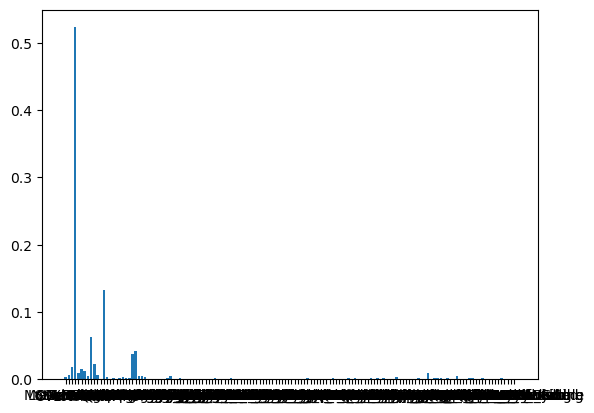

In [ ]:
plt.bar(x = RFR.feature_names_in_, height = RFR.feature_importances_)
plt.show()

In [ ]:
importances = RFR.feature_importances_
feature_names = RFR.feature_names_in_
feature_imp_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances}).sort_values(
    'Importance', ascending=False)
feature_imp_df

,Feature,Importance
3,OverallQual,5.234367e-01
12,GrLivArea,1.330071e-01
8,TotalBsmtSF,6.297672e-02
22,GarageArea,4.161632e-02
21,GarageCars,3.709077e-02
...,...,...
42,Neighborhood_BrDale,1.920911e-05
53,Neighborhood_NPkVill,1.569049e-05
39,LotConfig_FR3,1.256812e-05
41,Neighborhood_Blueste,1.181642e-06


C:\Users\Joseph\AppData\Local\Temp\ipykernel_15064\1511025811.py:5: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


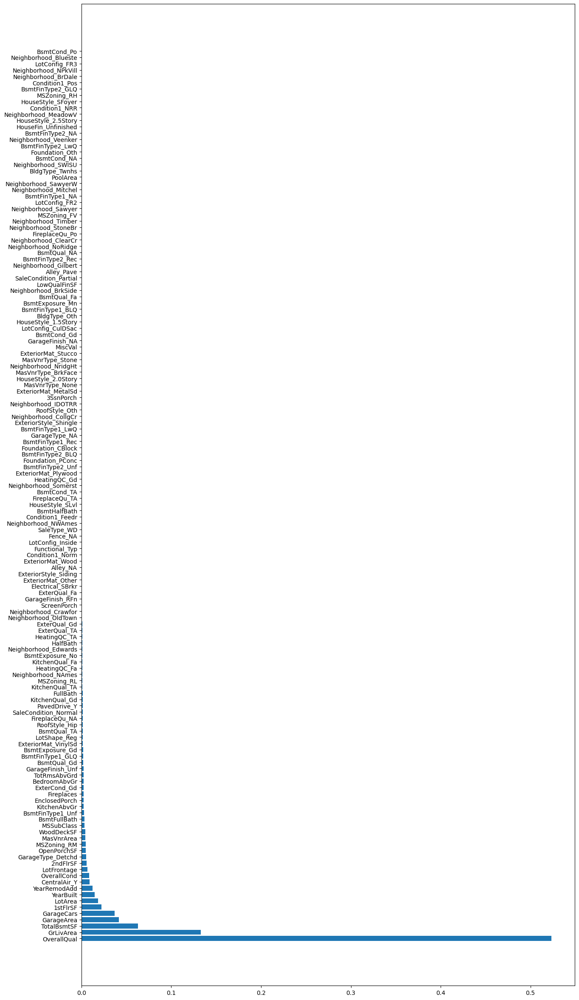

In [ ]:
fig , ax = plt.subplots(figsize=(15,30))


ax.barh(y = feature_imp_df['Feature'], width = feature_imp_df['Importance'])
fig.show()

In [ ]:
feature_imp_df['Importance'].sum()

np.float64(1.0)

In [ ]:
Importance = 0

for i in feature_imp_df['Importance']:
    Importance

In [ ]:
New_RFR_df = pd.DataFrame({'OverallQual':df['OverallQual'], 'GrLivArea':df['GrLivArea'], 'TotalBsmtSF':df['TotalBsmtSF'], 'GarageArea':df['GarageArea'], 'Garage':df['GarageCars'],'SalePriceLog':df['SalePriceLog']})
New_RFR_df

,OverallQual,GrLivArea,TotalBsmtSF,GarageArea,Garage,SalePriceLog
0,7,1710,856,548,2,12.247694
1,6,1262,1262,460,2,12.109011
2,7,1786,920,608,2,12.317167
3,7,1717,756,642,3,11.849398
4,8,2198,1145,836,3,12.429216
...,...,...,...,...,...,...
1455,6,1647,953,460,2,12.072541
1456,6,2073,1542,500,2,12.254863
1457,7,2340,1152,252,1,12.493130
1458,5,1078,1078,240,1,11.864462


In [ ]:
X = New_RFR_df.drop('SalePriceLog', axis=1)
y = New_RFR_df['SalePriceLog']

X_train,X_test,y_train,y_test = train_test_split(X, y, random_state=200, test_size=0.3)

In [ ]:
RFR.fit(X_train,y_train)

,n_estimators,100
,criterion,'squared_error'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,1.0
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [ ]:
y_pred = RFR.predict(X_test)

In [ ]:
RFR_MSE = mean_squared_error(y_test, y_pred)
print(RFR_MSE)
RFR_RMSE = root_mean_squared_error(y_test, y_pred)
print(RFR_RMSE)
RFR_MAE = mean_absolute_error(y_test, y_pred)
print(RFR_MAE)
RFR_r2 = r2_score(y_test, y_pred)
print(RFR_r2)

0.034082490106368456
0.18461443634333816
0.12423406158837516
0.7964147041478822


In [ ]:
LR = LinearRegression()
LR.fit(X_train, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
y_pred = LR.predict(X_test)
y_pred

array([11.73663482, 11.49473606, 11.41365816, 11.85859044, 12.01421221,
       12.0187216 , 12.16676501, 12.70796148, 12.31687859, 12.05993785,
       11.86260353, 12.06780155, 11.62782654, 12.71178037, 11.16041901,
       11.9432184 , 12.30223152, 13.02026716, 12.06354632, 12.02121285,
       11.82370915, 12.20471824, 11.77976279, 11.74558663, 12.70589588,
       12.76601857, 12.02962889, 11.72481528, 12.48757299, 11.80281375,
       11.96625093, 12.86717365, 12.46087221, 11.83561506, 12.13176878,
       12.28956569, 11.95709242, 11.85169739, 11.65003617, 11.6191084 ,
       12.21980449, 11.60869971, 12.55688571, 12.67035916, 12.10624814,
       11.736754  , 11.8287848 , 11.88520243, 11.4424232 , 11.93666782,
       12.07755473, 12.04395148, 11.96424619, 13.08289769, 12.11375253,
       11.6529307 , 12.25667921, 12.32529724, 11.7662108 , 11.57358649,
       11.72351232, 12.70931712, 13.39552733, 12.62454526, 12.21038449,
       11.99656583, 11.99679644, 11.48747264, 12.36313917, 12.56

##How to interpret error?
##Whether error is acceptable

In [ ]:
LR_MSE = mean_squared_error(y_test, y_pred)
print(LR_MSE)
LR_RMSE = root_mean_squared_error(y_test, y_pred)
print(LR_RMSE)
LR_MAE = mean_absolute_error(y_test, y_pred)
print(LR_MAE)
LR_r2 = r2_score(y_test, y_pred)
print(LR_r2)

0.01826974907168702
0.13516563569075912
0.0913605854531119
0.8908691161269241


In [ ]:
df['SalePriceLog'].describe()

NameError: name 'df' is not defined

In [ ]:
X_train = X_train.reset_index()
X_test = X_test.reset_index()
X_train = X_train.drop('index', axis = 1)
X_test = X_test.drop('index', axis = 1)
X_train

,OverallQual,GrLivArea,TotalBsmtSF,GarageArea,Garage
0,9,1922,1922,676,3
1,8,1234,1234,484,2
2,7,1200,600,480,2
3,5,999,999,264,1
4,7,1717,1156,400,2
...,...,...,...,...,...
1017,6,1194,655,539,2
1018,5,1416,876,720,3
1019,6,1309,1040,484,2
1020,6,1484,742,0,0


In [ ]:
numeric_index = []
for i in X_train.select_dtypes(include=['int', 'float']).columns:
    numeric_index.append(i)

X_train_numeric = X_train[numeric_index]
X_test_numeric = X_test[numeric_index]

X_train_numeric 

,OverallQual,GrLivArea,TotalBsmtSF,GarageArea,Garage
0,9,1922,1922,676,3
1,8,1234,1234,484,2
2,7,1200,600,480,2
3,5,999,999,264,1
4,7,1717,1156,400,2
...,...,...,...,...,...
1017,6,1194,655,539,2
1018,5,1416,876,720,3
1019,6,1309,1040,484,2
1020,6,1484,742,0,0


In [ ]:
pca = PCA(n_components=len(numeric_index) - 5)
pca.fit(X_train_numeric)
X_train_numeric_compressed = pd.DataFrame(pca.transform(X_train_numeric))
X_test_numeric_compressed = pd.DataFrame(pca.transform(X_test_numeric))

In [ ]:
X_test_numeric_compressed

""
0
1
2
3
4
...
433
434
435
436


In [ ]:
for dropping in numeric_index:
    X_train = X_train.drop(dropping, axis=1)
    X_test = X_test.drop(dropping, axis=1)

In [ ]:
X_train_joined = X_train.join(X_train_numeric_compressed, how='inner')
X_test_joined = X_test.join(X_test_numeric_compressed, how='inner')
X_train_joined

""
0
1
2
3
4
...
1017
1018
1019
1020


In [ ]:
X_test_joined

""
0
1
2
3
4
...
433
434
435
436


In [ ]:
X_train = X_train_joined
X_test = X_test_joined
X_train.columns = X_train.columns.astype(str)
X_test.columns = X_test.columns.astype(str)
X_train

""
0
1
2
3
4
...
1017
1018
1019
1020


In [ ]:
y_train

336     12.841130
32      12.100156
831     11.925035
484     11.794338
881     12.141534
          ...    
1103    11.979799
844     11.944058
810     12.106252
784     11.759786
617     11.566466
Name: SalePriceLog, Length: 1022, dtype: float64

In [ ]:
from sklearn.linear_model import LinearRegression

estimator = LinearRegression()
selector = RFE(estimator, n_features_to_select=150, step=1)
selector = selector.fit(X_train, y_train)

In [ ]:
for i in df.columns:
    x = df[i].isna().sum()
    if x > 0:
        print(f'{i}: {x}')


In [ ]:
selector.support_

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [ ]:
selector.ranking_

array([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  4,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
       12,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  8,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1, 21, 10, 13, 16, 19, 14, 18, 15,
        9, 20, 17, 11,  5,  7,  6,  3,  1,  2,  1,  1,  1,  1,  1,  1,  1])

In [ ]:
result = pd.DataFrame()
for i in range(len(selector.support_)):
    if selector.support_[i] == True:
        result[X_train.columns[i]] = X_train[X_train.columns[i]]
        
result.columns

C:\Users\Joseph\AppData\Local\Temp\ipykernel_15132\1712168742.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  result[X_train.columns[i]] = X_train[X_train.columns[i]]
C:\Users\Joseph\AppData\Local\Temp\ipykernel_15132\1712168742.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  result[X_train.columns[i]] = X_train[X_train.columns[i]]
C:\Users\Joseph\AppData\Local\Temp\ipykernel_15132\1712168742.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which 

Index(['MSZoning_C (all)', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL',
       'MSZoning_RM', 'Alley_Grvl', 'Alley_NA', 'Alley_Pave', 'LotShape_IR',
       'LotShape_Reg',
       ...
       'ExteriorStyle_Shingle', 'ExteriorStyle_Siding', '16', '18', '19', '20',
       '21', '22', '23', '24'],
      dtype='object', length=150)

In [ ]:
params = selector.get_params()
params["estimator"].fit(result, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
X_test = pd.get_dummies(X_test)
result_test = pd.DataFrame()
for i in range(len(selector.support_)):
    if selector.support_[i] == True:
        result_test[X_test.columns[i]] = X_test[X_test.columns[i]]

C:\Users\Joseph\AppData\Local\Temp\ipykernel_15132\2607378092.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  result_test[X_test.columns[i]] = X_test[X_test.columns[i]]
C:\Users\Joseph\AppData\Local\Temp\ipykernel_15132\2607378092.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  result_test[X_test.columns[i]] = X_test[X_test.columns[i]]
C:\Users\Joseph\AppData\Local\Temp\ipykernel_15132\2607378092.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, wh

In [ ]:
result_test

,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_Grvl,Alley_NA,Alley_Pave,LotShape_IR,LotShape_Reg,...,ExteriorStyle_Shingle,ExteriorStyle_Siding,16,18,19,20,21,22,23,24
0,False,False,False,True,False,False,True,False,False,True,...,False,False,-5.136891,-0.597148,0.142362,-0.328461,-0.073623,-0.401363,0.715143,-0.104023
1,False,False,False,False,True,False,True,False,False,True,...,False,True,-7.731572,0.909209,-0.050898,0.050680,-0.424705,0.047629,0.171354,0.600769
2,False,False,False,True,False,False,True,False,False,True,...,False,False,-2.877139,-0.375943,-1.225547,-0.578084,0.145488,-0.602540,-0.433205,0.668705
3,False,False,False,True,False,False,True,False,True,False,...,False,False,2.652059,-0.028878,1.466304,0.281110,-0.306078,-0.456148,-0.300040,0.295401
4,False,False,False,False,True,True,False,False,False,True,...,False,True,39.959604,1.786013,1.854324,2.180864,-0.058162,0.418844,0.428759,0.803171
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
433,False,False,False,True,False,False,True,False,False,True,...,False,False,2.129215,-0.185623,-0.031171,0.241568,0.187595,0.839992,-0.076505,-0.049657
434,False,False,False,True,False,False,True,False,True,False,...,False,True,15.963331,-0.846308,0.661897,0.234197,0.014671,-0.350555,0.608804,-0.061315
435,False,False,False,True,False,False,True,False,True,False,...,False,True,-18.391852,0.090790,-1.066213,-0.700996,0.682336,-0.257020,-0.465644,-0.640076
436,False,False,False,False,True,False,True,False,False,True,...,False,True,-28.762322,-0.969001,1.144974,-1.085355,0.572778,-0.499991,0.351122,-0.304340


In [ ]:
y_pred = params["estimator"].predict(result_test)

In [ ]:
y_pred

array([11.84982744, 11.61660272, 11.42387707, 11.94961994, 11.97895075,
       11.99375361, 12.24375409, 12.59352218, 12.18284801, 12.10220623,
       11.88772156, 12.08920896, 11.62451171, 12.64830977, 11.24746464,
       11.89421454, 12.18354448, 13.02752787, 11.86408943, 12.06069832,
       11.93570827, 12.09418253, 11.84487468, 11.84762306, 12.64861223,
       12.74510493, 12.16928887, 11.75737031, 12.30821621, 11.76962897,
       11.9436471 , 12.89078048, 12.56565419, 11.78287647, 11.9658403 ,
       12.29997334, 11.88182056, 11.98676456, 11.72298641, 11.68531201,
       12.31054361, 11.69744678, 12.7212005 , 12.84420878, 12.08418547,
       11.71331204, 11.8714527 , 11.84490446, 11.31495886, 11.84564954,
       12.06698685, 12.03375476, 11.93696592, 12.97276896, 12.06004449,
       11.52581467, 12.29501118, 12.05561769, 11.95776365, 11.53243907,
       11.77345309, 12.59066886, 13.0304923 , 12.69510853, 12.14977234,
       11.96347402, 12.05466332, 11.61773346, 12.365427  , 12.60

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, r2_score

In [ ]:
LR_RFE_MSE = mean_squared_error(y_test, y_pred)
LR_RFE_MSE

0.02767022653227473

In [ ]:
LR_RFE_RMSE = root_mean_squared_error(y_test, y_pred)
LR_RFE_RMSE

0.16634370000776924

In [ ]:
LR_RFE_MAE = mean_absolute_error(y_test, y_pred)
LR_RFE_MAE

0.12162933297907608

In [ ]:
LR_RFE_r2 = r2_score(y_test, y_pred)
LR_RFE_r2

0.8347171454524775

In [ ]:
from sklearn.ensemble import RandomForestRegressor

estimator = RandomForestRegressor()
selector = RFE(estimator, n_features_to_select=50, step=1)
selector = selector.fit(X_train, y_train)


In [ ]:
selector.support_

array([False, False, False,  True,  True, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False,  True, False,  True,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
        True,  True, False, False, False, False, False,  True,  True,
       False,  True, False,  True, False, False, False, False, False,
       False,  True, False,  True, False, False,  True, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False,  True,  True, False, False,  True,
       False,  True,  True, False, False, False,  True, False, False,
        True, False, False,  True, False, False,  True, False, False,
       False, False,

In [ ]:
result = pd.DataFrame()
for i in range(len(selector.support_)):
    if selector.support_[i] == True:
        result[X_train.columns[i]] = X_train[X_train.columns[i]]

params = selector.get_params()
params["estimator"].fit(result, y_train)

,n_estimators,100
,criterion,'squared_error'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,1.0
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [ ]:
X_test = pd.get_dummies(X_test)
result_test = pd.DataFrame()
for i in range(len(selector.support_)):
    if selector.support_[i] == True:
        result_test[X_test.columns[i]] = X_test[X_test.columns[i]]

y_pred = params["estimator"].predict(result_test)

In [ ]:
y_pred

array([11.83435005, 11.61879709, 11.54778926, 11.91025875, 12.10300658,
       12.06190596, 12.12184841, 12.67638605, 12.43919561, 11.89287828,
       11.98983041, 12.09477229, 11.83141646, 12.79276834, 11.20839487,
       11.905057  , 12.37014343, 12.98227908, 12.08966031, 12.13845436,
       11.68160263, 12.0226609 , 11.71137644, 11.81546712, 12.65476754,
       12.94077361, 12.01935541, 11.76005822, 12.61896389, 11.99889075,
       11.83846423, 12.7754533 , 12.45623712, 11.72094087, 11.99053217,
       12.39634771, 11.8511011 , 11.70356578, 11.67518145, 11.655063  ,
       12.10709896, 11.70188616, 12.73051409, 12.59893313, 12.04096403,
       11.7426462 , 11.86270957, 12.00513968, 11.48985841, 11.8663588 ,
       11.91785273, 12.06834449, 11.93156959, 12.95421028, 11.76200719,
       11.82769731, 12.0709293 , 12.16992149, 11.6402075 , 11.61116185,
       11.71768001, 12.67596692, 12.94666768, 12.66512905, 12.25838687,
       12.01825674, 12.01000181, 11.27695233, 12.54360109, 12.66

In [ ]:
RFR_RFE_MSE = mean_squared_error(y_test, y_pred)
print(RFR_RFE_MSE)
RFR_RFE_RMSE = root_mean_squared_error(y_test, y_pred)
print(RFR_RFE_RMSE)
RFR_RFE_MAE = mean_absolute_error(y_test, y_pred)
print(RFR_RFE_MAE)
RFR_RFE_r2 = r2_score(y_test, y_pred)
print(RFR_RFE_r2)

0.02590674821905544
0.1609557337253179
0.10724131970789035
0.845250948968743


In [ ]:
RFR = RandomForestRegressor()
RFR.fit()

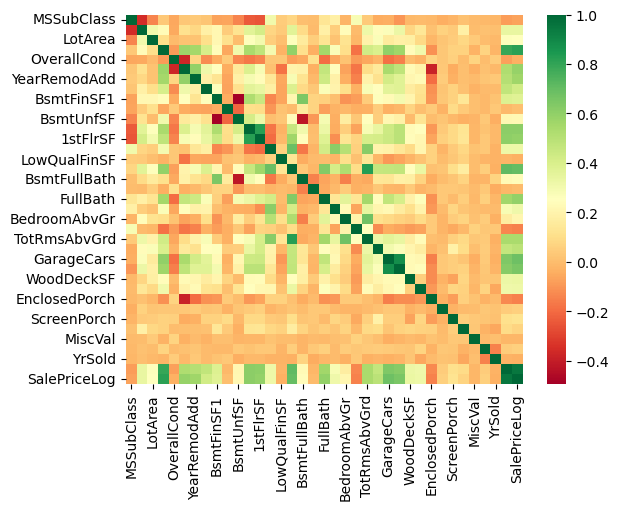

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,TotalBsmtSF,1stFlrSF,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePriceLog
MSSubClass,1789.338306,-332.643526,-5.901742e+04,1.908771,-2.792117,35.581337,35.439934,180.218892,-4.426302e+03,-4.116975e+03,...,-1.267945,-892.392035,-66.694532,-17.096613,-31.119180,-54.348569,-61.394007,14.076652,-161.243759,-1.249689
LotFrontage,-332.643526,485.057575,6.744194e+04,7.133417,-1.294531,78.224958,37.624122,711.300655,3.510783e+03,3.527154e+03,...,4.439437,1524.077690,212.849152,200.576959,13.178271,40.249123,46.276424,160.043618,12.765918,2.957343
LotArea,-59017.418634,67441.942660,9.962565e+07,1460.548271,-62.602871,4289.113242,2841.343594,186377.236500,1.142145e+06,1.155563e+06,...,1155.203940,384987.194664,214800.625342,56062.527573,-11188.088772,5976.210971,24020.024881,31148.209380,188508.749657,1025.943398
OverallQual,1.908771,7.133417,1.460548e+03,1.912679,-0.141484,23.906215,15.723417,101.794528,3.263034e+02,2.546128e+02,...,0.620814,166.184976,41.415726,28.297642,-9.630806,1.231398,5.003537,3.620945,-21.548945,0.451446
OverallCond,-2.792117,-1.294531,-6.260287e+01,-0.141484,1.238322,-12.636709,1.694152,-25.278432,-8.352827e+01,-6.203526e+01,...,-0.154478,-36.050250,-0.464974,-2.402762,4.785160,0.832039,3.400819,-0.088745,37.970669,-0.016388
YearBuilt,35.581337,78.224958,4.289113e+03,23.906215,-12.636709,912.215413,369.675456,1700.909349,5.186807e+03,3.292487e+03,...,12.139859,3092.857277,851.305272,377.583847,-714.886948,27.763434,-84.815514,6.006353,-515.209195,7.076739
YearRemodAdd,35.439934,37.624122,2.841344e+03,15.723417,1.694152,369.675456,426.232822,658.702322,2.636254e+03,1.918530e+03,...,6.489620,1640.274234,532.350875,309.548604,-244.692937,27.410061,-44.594964,4.835329,-105.358566,4.664481
MasVnrArea,180.218892,711.300655,1.863772e+05,101.794528,-25.278432,1700.909349,658.702322,32664.110650,2.854885e+04,2.374489e+04,...,48.885782,14331.473171,3624.232814,1467.268275,-1214.116000,101.439191,627.297942,86.619428,-2651.844858,30.810552
TotalBsmtSF,-4426.301975,3510.782606,1.142145e+06,326.303447,-83.528266,5186.807460,2636.253717,28548.846760,1.924624e+05,1.389907e+05,...,142.479105,45647.917378,12757.960031,7187.183693,-2560.072808,480.817127,2066.691418,2221.812315,-4021.970959,107.271375
1stFlrSF,-4116.974635,3527.154168,1.155563e+06,254.612835,-62.035256,3292.487290,1918.529702,23744.885597,1.389907e+05,1.494501e+05,...,126.919864,40482.574486,11409.015945,5421.697635,-1542.706655,635.871300,1913.192065,2042.853052,-4046.055156,92.187720


In [ ]:
df_numeric = df.select_dtypes(include=['int', 'float']).columns
df_cov = df[df_numeric].cov()
sns.heatmap(df_corr, cmap='RdYlGn')
plt.show()
df_cov

In [ ]:
from sklearn.feature_selection import SequentialFeatureSelector

estimator = LinearRegression()
selector = SequentialFeatureSelector(estimator, n_features_to_select=50)
selector = selector.fit(X_train, y_train)

In [ ]:
selector.get_feature_names_out()

array(['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'GrLivArea', 'BsmtFullBath', 'GarageCars',
       'WoodDeckSF', 'OpenPorchSF', '3SsnPorch', 'ScreenPorch',
       'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM',
       'LotShape_Reg', 'LotConfig_CulDSac', 'LotConfig_FR2',
       'LotConfig_FR3', 'Neighborhood_Crawfor', 'Neighborhood_Edwards',
       'Neighborhood_MeadowV', 'Neighborhood_NoRidge',
       'Neighborhood_NridgHt', 'Neighborhood_StoneBr',
       'Neighborhood_Timber', 'Neighborhood_Veenker', 'Condition1_Norm',
       'BldgType_Oth', 'HouseStyle_2.5Story', 'HouseStyle_SLvl',
       'Foundation_PConc', 'BsmtQual_NA', 'BsmtCond_NA',
       'BsmtExposure_Gd', 'BsmtFinType1_GLQ', 'BsmtFinType1_Unf',
       'BsmtFinType2_GLQ', 'BsmtFinType2_NA', 'HeatingQC_TA',
       'CentralAir_Y', 'Functional_Typ', 'FireplaceQu_NA',
       'GarageFinish_Unf', 'PavedDrive_Y', 'Fence_NA',
       'ExteriorMat_Other', 'ExteriorStyle_Sidin

In [ ]:
selector.get_support()

array([ True, False,  True,  True,  True,  True,  True, False, False,
       False, False, False,  True,  True, False, False, False, False,
       False, False, False,  True, False,  True,  True, False,  True,
        True, False, False,  True,  True,  True,  True, False, False,
        True,  True,  True,  True, False, False, False, False, False,
       False,  True,  True, False, False,  True, False, False, False,
       False,  True,  True, False, False, False, False, False,  True,
        True,  True, False, False,  True, False,  True, False, False,
       False,  True, False,  True, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
        True, False, False,  True, False, False,  True, False, False,
       False,  True, False, False, False,  True, False,  True, False,
        True, False, False, False, False,  True,  True, False, False,
       False, False,  True,  True, False, False, False, False, False,
       False,  True,

In [ ]:
selector.transform(X_train)

array([[2.0000e+01, 1.4157e+04, 9.0000e+00, ..., 1.0000e+00, 0.0000e+00,
        1.0000e+00],
       [2.0000e+01, 1.1049e+04, 8.0000e+00, ..., 1.0000e+00, 0.0000e+00,
        1.0000e+00],
       [1.6000e+02, 3.1800e+03, 7.0000e+00, ..., 1.0000e+00, 0.0000e+00,
        1.0000e+00],
       ...,
       [2.0000e+01, 1.0140e+04, 6.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [7.5000e+01, 6.3000e+03, 6.0000e+00, ..., 1.0000e+00, 0.0000e+00,
        0.0000e+00],
       [4.5000e+01, 7.2270e+03, 6.0000e+00, ..., 1.0000e+00, 0.0000e+00,
        1.0000e+00]], shape=(1022, 50))

In [ ]:
selector.get_params()

{'cv': 5,
 'direction': 'forward',
 'estimator__copy_X': True,
 'estimator__fit_intercept': True,
 'estimator__n_jobs': None,
 'estimator__positive': False,
 'estimator__tol': 1e-06,
 'estimator': LinearRegression(),
 'n_features_to_select': 50,
 'n_jobs': None,
 'scoring': None,
 'tol': None}

In [ ]:
result = pd.DataFrame()
for i in range(len(selector.get_support())):
    if selector.get_support()[i] == True:
        result[X_train.columns[i]] = X_train[X_train.columns[i]]

params = selector.get_params()
params["estimator"].fit(result, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
X_test = pd.get_dummies(X_test)
result_test = pd.DataFrame()
for i in range(len(selector.support_)):
    if selector.support_[i] == True:
        result_test[X_test.columns[i]] = X_test[X_test.columns[i]]

y_pred = params["estimator"].predict(result_test)

In [ ]:
LR_SFS_MSE = mean_squared_error(y_test, y_pred)
print(LR_SFS_MSE)
LR_SFS_RMSE = root_mean_squared_error(y_test, y_pred)
print(LR_SFS_RMSE)
LR_SFS_MAE = mean_absolute_error(y_test, y_pred)
print(LR_SFS_MAE)
LR_SFS_r2 = r2_score(y_test, y_pred)
print(LR_SFS_r2)

0.019354787429365212
0.1391214844276944
0.09844058308167289
0.8843878451173995


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SequentialFeatureSelector


class LinearRegressionTransform(LinearRegression):
    def __init__(self):
        LinearRegression.__init__(self)
        
    def transform(self, input):
        return self.predict(input)

estimator = LinearRegressionTransform()
selector = SequentialFeatureSelector(estimator)
perform_pca = ColumnTransformer([("numeric_data", PCA(), numeric_index)], remainder='passthrough')
#elector_features = selector.get_feature_names_out()

numeric_index = []
for i in X_train.select_dtypes(include=['int', 'float']).columns:
    numeric_index.append(i)

categorical_index = []
for i in X_train.select_dtypes(include=['bool']).columns:
    categorical_index.append(i)

print(categorical_index)
print(numeric_index)
pipeline = Pipeline([
            ('perform_pca', perform_pca),
            ('reduce_dim', selector),
            ('linear_regression', estimator)
            ])
pipeline

['MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'Alley_NA', 'Alley_Pave', 'LotShape_Reg', 'LotConfig_CulDSac', 'LotConfig_FR2', 'LotConfig_FR3', 'LotConfig_Inside', 'Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_Mitchel', 'Neighborhood_NAmes', 'Neighborhood_NPkVill', 'Neighborhood_NWAmes', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_SWISU', 'Neighborhood_Sawyer', 'Neighborhood_SawyerW', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Timber', 'Neighborhood_Veenker', 'Condition1_Feedr', 'Condition1_NRR', 'Condition1_Norm', 'Condition1_Pos', 'BldgType_Oth', 'BldgType_Twnhs', 'HouseStyle_1.5Story', 'HouseStyle_2.0Story', 'HouseStyle_2.5Story', 'HouseStyle_SFoyer', 'HouseStyle_SLvl', 'RoofStyle_Hip', 'RoofStyle_Oth', 'Ma

,steps,"[('perform_pca', ...), ('reduce_dim', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('numeric_data', ...)]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [ ]:
model = GridSearchCV(pipeline, {'reduce_dim__n_features_to_select': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0], 'perform_pca__numeric_data__n_components': [0.001 ,0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.10]
                                
                                }, scoring='neg_root_mean_squared_error', n_jobs = -1)

y = df['SalePriceLog']
X = df.drop('SalePriceLog', axis=1)
X = pd.get_dummies(X, drop_first=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=200)

model.fit(X_train, y_train)

,estimator,Pipeline(step...Transform())])
,param_grid,"{'perform_pca__numeric_data__n_components': [0.001, 0.01, ...], 'reduce_dim__n_features_to_select': [0.1, 0.2, ...]}"
,scoring,'neg_root_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,None
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,transformers,"[('numeric_data', ...)]"


In [ ]:
model.best_estimator_

,steps,"[('perform_pca', ...), ('reduce_dim', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('numeric_data', ...)]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [ ]:
y_predict = model.best_estimator_.transform(X_test)

In [ ]:
LR_MSE = mean_squared_error(y_test, y_predict)
print(LR_MSE)
LR_RMSE = root_mean_squared_error(y_test, y_predict)
print(LR_RMSE)
LR_MAE = mean_absolute_error(y_test, y_predict)
print(LR_MAE)
LR_r2 = r2_score(y_test, y_predict)
print(LR_r2)

0.03083063781604009
0.1755865536310799
0.12907287310558388
0.8158390275622733


In [ ]:
import joblib
joblib.dump()

NotFittedError: This LinearRegressionTransform instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

In [ ]:
#estimator = RandomForestRegressor()
#selector = SequentialFeatureSelector(estimator, n_features_to_select=50)
#selector = selector.fit(X_train, y_train)

In [ ]:
#elector.get_support()

In [ ]:
#selector.get_params()

In [ ]:
#result = pd.DataFrame()
#for i in range(len(selector.get_support())):
#    if selector.get_support()[i] == True:
#        result[X_train.columns[i]] = X_train[X_train.columns[i]]

#params = selector.get_params()
#params["estimator"].fit(result, y_train)

In [ ]:
#X_test = pd.get_dummies(X_test)
#result_test = pd.DataFrame()
#for i in range(len(selector.support_)):
#    if selector.support_[i] == True:
#        result_test[X_test.columns[i]] = X_test[X_test.columns[i]]

#y_pred = params["estimator"].predict(result_test)

In [ ]:
#RFR_SFS_MSE = mean_squared_error(y_test, y_pred)
#print(RFR_SFS_MSE)
#RFR_SFS_RMSE = root_mean_squared_error(y_test, y_pred)
#print(RFR_SFS_RMSE)
#RFR_SFS_MAE = mean_absolute_error(y_test, y_pred)
#print(RFR_SFS_MAE)
#RFR_SFS_r2 = r2_score(y_test, y_pred)
#print(RFR_SFS_r2)

In [ ]:
print(f'''Liner Regression Error w/ Recursive Feature Extraction
------------------------------------------------------------------------------
MSE  : {LR_RFE_MSE}
RMSE : {LR_RFE_RMSE}
MAE  : {LR_RFE_MAE}
r2   : {LR_RFE_r2}
------------------------------------------------------------------------------

Random Forest Regression Error w/ Recursive Feature Extraction
------------------------------------------------------------------------------
MSE  : {RFR_RFE_MSE}
RMSE : {RFR_RFE_RMSE}
MAE  : {RFR_RFE_MAE}
r2   : {RFR_RFE_r2}
------------------------------------------------------------------------------

Linear Regression Error w/ Sequential Feature Selection
------------------------------------------------------------------------------
MSE  : {LR_SFS_MSE}
RMSE : {LR_SFS_RMSE}
MAE  : {LR_SFS_MAE}
r2   : {LR_SFS_r2}
------------------------------------------------------------------------------
''')